# Drug Use Data Analysis


In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/STAT 437 Project')


In [ ]:
# %cd drive/MyDrive/STAT\ 437\ Project

In [ ]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 8.8 MB/s eta 0:00:00


In [ ]:
# imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import DBSCAN
from skfuzzy.cluster import cmeans
from sklearn.metrics import adjusted_rand_score, silhouette_score, silhouette_samples

## 1. Introduction

Research Introduction and Motivation (take out later on)

Alcohol and tobacco have been consumed by humans for thousands of years, with their origins tracing back 6,000–7,000 years ago, marijuana 3,000 years ago, and illicit drugs only a century old. "Alcohol and tobacco are among the oldest known substances consumed by humans, both playing significant roles in culture and health for millennia" (Courtwright, 2001). What these substances have in common is that they negatively impact the health of users and have become a serious public health issue due to increased accessibility. "Increased global access to illicit drugs over the past century has transformed substance use from an individual issue to a major public health challenge" (United Nations Office on Drugs and Crime, 2023). By analyzing this dataset, public health officials and policymakers can gain insights into usage trends and design targeted strategies to combat substance use more effectively. "Analyzing substance use data is critical for understanding patterns and implementing targeted interventions, reducing the burden on healthcare systems" (National Institute on Drug Abuse, 2023).

Since the research application is to target relationships in substance usage to effectively combat these behaviors, a well-separated cluster would be very useful to public health officials and policymakers. This approach makes it easy and cost-efficient to target groups or clusters identified as having high usage while avoiding those known to have lower rates of substance abuse. If the result is a clustering where at least one cluster is a singleton outlier, its usefulness would depend on the context. Targeting this outlier might be less effective in a broader sense, as it would focus on a very specific group. However, it could also make targeting easier since the cluster is so isolated. A fuzzy clustering would be useful for overlapping behaviors, as solutions could be created to effectively target multiple areas simultaneously. Finally, a dendrogram displaying a nested cluster relationship would be useful for understanding hierarchical relationships.

**Research Objective/Question**

To explore and analyze inherent clusters in drug abuse and substance use rates across U.S. states before (2006-2007) and after (2008-2009) the economic crisis in the late 2000s, and thus identify patterns or changes in substance use behaviors among different age groups or states

## 2. Dataset Discussion

We got the US Drug Abuse dataset from Professor Ellison's final project folder on November 27th, however, it can also be found on kaggle at https://www.kaggle.com/datasets/mexwell/us-drug-abuse or from CORGIS on https://corgis-edu.github.io/corgis/csv/drugs/


Originally, there are 867 rows and 53 columns before cleaning

In [ ]:
df = pd.read_csv("drugs.csv")
print(len(df))
df.head()

867


,State,Year,Population.12-17,Population.18-25,Population.26+,Totals.Alcohol.Use Disorder Past Year.12-17,Totals.Alcohol.Use Disorder Past Year.18-25,Totals.Alcohol.Use Disorder Past Year.26+,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,...,Totals.Marijuana.Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+,Totals.Tobacco.Use Past Month.12-17,Totals.Tobacco.Use Past Month.18-25,Totals.Tobacco.Use Past Month.26+,Rates.Tobacco.Use Past Month.12-17,Rates.Tobacco.Use Past Month.18-25,Rates.Tobacco.Use Past Month.26+
0,Alabama,2002,380805,499453,2812905,18,68,138,48.336,136.490,...,141,127.535,237.880,50.275,63,226,930,166.578,451.976,330.659
1,Alaska,2002,69400,62791,368460,4,12,27,61.479,187.891,...,46,188.730,389.026,124.566,11,30,112,163.918,484.270,304.220
2,Arizona,2002,485521,602265,3329482,36,117,258,73.819,193.626,...,215,169.646,275.435,64.640,73,240,1032,151.071,397.968,309.969
3,Arkansas,2002,232986,302029,1687337,14,53,101,61.457,175.913,...,104,157.567,288.856,61.510,46,169,660,195.714,558.846,391.210
4,California,2002,3140739,3919577,21392421,173,581,1298,55.109,148.312,...,1670,141.067,282.887,78.068,290,1377,4721,92.235,351.353,220.699


In [ ]:
columns = list(df.columns)
rows = [columns[i:i + 5] for i in range(0, len(columns), 5)]
for row in rows:
    print(" | ".join(row))

State | Year | Population.12-17 | Population.18-25 | Population.26+
Totals.Alcohol.Use Disorder Past Year.12-17 | Totals.Alcohol.Use Disorder Past Year.18-25 | Totals.Alcohol.Use Disorder Past Year.26+ | Rates.Alcohol.Use Disorder Past Year.12-17 | Rates.Alcohol.Use Disorder Past Year.18-25
Rates.Alcohol.Use Disorder Past Year.26+ | Totals.Alcohol.Use Past Month.12-17 | Totals.Alcohol.Use Past Month.18-25 | Totals.Alcohol.Use Past Month.26+ | Rates.Alcohol.Use Past Month.12-17
Rates.Alcohol.Use Past Month.18-25 | Rates.Alcohol.Use Past Month.26+ | Totals.Tobacco.Cigarette Past Month.12-17 | Totals.Tobacco.Cigarette Past Month.18-25 | Totals.Tobacco.Cigarette Past Month.26+
Rates.Tobacco.Cigarette Past Month.12-17 | Rates.Tobacco.Cigarette Past Month.18-25 | Rates.Tobacco.Cigarette Past Month.26+ | Totals.Illicit Drugs.Cocaine Used Past Year.12-17 | Totals.Illicit Drugs.Cocaine Used Past Year.18-25
Totals.Illicit Drugs.Cocaine Used Past Year.26+ | Rates.Illicit Drugs.Cocaine Used Past Y

This dataset contains the US drug abuse report information from 2002 to 2018, including the following types of variables (column headers):

1. The US State for the corresponding report
2. Year the report was drafted
3. Estimated population from US census for the above year corresponding to three ranges (12-17, 18-25, 26+)
4. Estimated number of people (in thousands) for a specific age range satisfying certain conditions (i.e. use disorder in the past year) for each type of "drug" (i.e Tobacco, Marijuana...)
5. Estimated rate (out of 1000) of people for a specific age range experiencing certain conditions (i.e. use disorder in the past year) for each type of "drug" (i.e Tobacco, Marijuana...). This is related to variables from 3 and 4.

The data was collected from individual states as part of the National Survey on Drugs Use and Health (NSDUH) study.

It is not fully representative of all possible data that can be considered in a Drug Abuse study dataset. For example, there is uneven coverage across drugs: Alcohol and Marijuana have more detailed metrics like condition by month, while others have fewer related columns. We are also missing other information for example the population by gender or socioeconomic status or some lesser known drugs.

These faults may impact public health officials by forcing them to limit the investigation to certain drug types, thus overlooking potentially emerging abuse patterns or trends from lesser known causes. They might also need to create more general policies as there is lack of detailed demographic data like gender or economic status to help support inclusivity.



We intend to use all of the estimated rate variables related by year. Thus we will be taking out all of the totals, rates by month, and other unrelated columns. We are planning to separate by combining the data from years 2006-2007 and 2008-2009 and comparing them.

## 3. Dataset Cleaning and Exploration

### 3.1 Missing Values and Unused Columns

Doing a preliminary analysis, we do not find any pre-existing explicit missing values

In [ ]:
# 1. Missing Value Detection and Cleaning
print("Missing Values:\n", df.isnull().sum())

Missing Values:
 State                                                0
Year                                                 0
Population.12-17                                     0
Population.18-25                                     0
Population.26+                                       0
Totals.Alcohol.Use Disorder Past Year.12-17          0
Totals.Alcohol.Use Disorder Past Year.18-25          0
Totals.Alcohol.Use Disorder Past Year.26+            0
Rates.Alcohol.Use Disorder Past Year.12-17           0
Rates.Alcohol.Use Disorder Past Year.18-25           0
Rates.Alcohol.Use Disorder Past Year.26+             0
Totals.Alcohol.Use Past Month.12-17                  0
Totals.Alcohol.Use Past Month.18-25                  0
Totals.Alcohol.Use Past Month.26+                    0
Rates.Alcohol.Use Past Month.12-17                   0
Rates.Alcohol.Use Past Month.18-25                   0
Rates.Alcohol.Use Past Month.26+                     0
Totals.Tobacco.Cigarette Past Month.12-17       

We can look for implicit ones in the categorical columns or zeroed out values

In [ ]:
df.select_dtypes(include=['object'])
df['State'].unique()

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

Now since we want to filter out by rates and year for for 2006-2007 and 2008-2009, we create two new dataframes.

In [ ]:
column_list= list(df.columns)
Totals_columns=[]
Rates_columns=[]
for column in column_list:
    if "Totals" in column:
        Totals_columns.append(column)
    elif "Rates" in column:
        Rates_columns.append(column)

In [ ]:
df_rates = df.drop(columns=Totals_columns)
df_rates.columns

Index(['State', 'Year', 'Population.12-17', 'Population.18-25',
       'Population.26+', 'Rates.Alcohol.Use Disorder Past Year.12-17',
       'Rates.Alcohol.Use Disorder Past Year.18-25',
       'Rates.Alcohol.Use Disorder Past Year.26+',
       'Rates.Alcohol.Use Past Month.12-17',
       'Rates.Alcohol.Use Past Month.18-25',
       'Rates.Alcohol.Use Past Month.26+',
       'Rates.Tobacco.Cigarette Past Month.12-17',
       'Rates.Tobacco.Cigarette Past Month.18-25',
       'Rates.Tobacco.Cigarette Past Month.26+',
       'Rates.Illicit Drugs.Cocaine Used Past Year.12-17',
       'Rates.Illicit Drugs.Cocaine Used Past Year.18-25',
       'Rates.Illicit Drugs.Cocaine Used Past Year.26+',
       'Rates.Marijuana.New Users.12-17', 'Rates.Marijuana.New Users.18-25',
       'Rates.Marijuana.New Users.26+',
       'Rates.Marijuana.Used Past Month.12-17',
       'Rates.Marijuana.Used Past Month.18-25',
       'Rates.Marijuana.Used Past Month.26+',
       'Rates.Marijuana.Used Past Year.12-1

We also need to remove the population as it is redundant with rates involved, and the new_users in Marijuana as they do not provide enough data to help our investigation even as a side analysis

In [ ]:
to_drop = [
    'Rates.Marijuana.New Users.12-17',
    'Rates.Marijuana.New Users.18-25',
    'Rates.Marijuana.New Users.26+',
    'Population.12-17',
    'Population.18-25',
    'Population.26+'
]
df_rates = df_rates.drop(columns=to_drop)

In [ ]:
df_rates_year = df[['State', 'Year'] + [col for col in df_rates.columns if 'Past Year' in col]]
df_rates_month = df[['State', 'Year'] +  [col for col in df_rates.columns if 'Past Month' in col]]

df_rates_year_2006_2007 = df_rates_year[df_rates_year["Year"].isin([2006, 2007])]
df_rates_year_2008_2009 = df_rates_year[df_rates_year["Year"].isin([2008, 2009])]

Alfter filtering the 4 years we want, we find no values where the rate is 0%

In [ ]:
mask0 = df_rates_year_2006_2007.select_dtypes(include=['float64', 'int64']) <= 0
mask1 = df_rates_year_2008_2009.select_dtypes(include=['float64', 'int64']) <= 0

print(mask0.stack()[mask0.stack()])
print(mask1.stack()[mask1.stack()])

Series([], dtype: bool)
Series([], dtype: bool)


Then we can drop year as it is not particularly useful for our clustering

In [ ]:
df_rates_year_2006_2007 = df_rates_year_2006_2007.drop(columns=['Year'])
df_rates_year_2008_2009 = df_rates_year_2008_2009.drop(columns=['Year'])

### 3.2 Outlier Identification - Two Variable Outliers

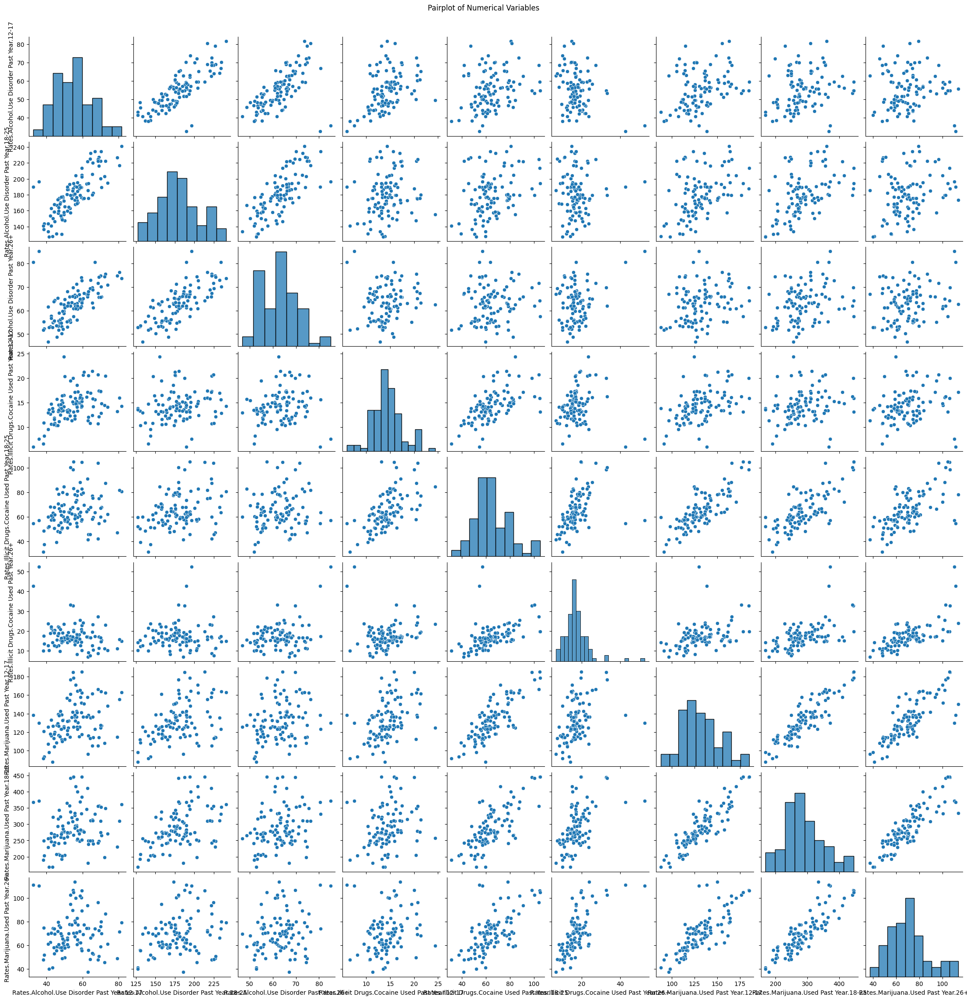

In [ ]:
numerical_vars = df_rates_year_2006_2007.select_dtypes(include=['int64', 'float64']).columns
X_2006_2007 = df_rates_year_2006_2007[numerical_vars].copy()

sns.pairplot(X_2006_2007)
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()

From the above dataset, we can see the only two noticeable outliers come from the Illicit Cocaine Used Past Year for age 26+, as shown below. However, as they correspond to Washington D.C., we decided not to remove them as they do provide insight into regional differences.

In [ ]:
df_rates_year_2006_2007.sort_values(by='Rates.Illicit Drugs.Cocaine Used Past Year.26+', ascending=False).head()

,State,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
212,District of Columbia,35.900,196.714,85.072,7.523,57.231,52.488,129.952,372.018,110.340
263,District of Columbia,32.611,189.924,80.549,5.966,54.765,42.654,138.453,367.415,111.346
294,Rhode Island,53.300,179.341,62.022,16.264,100.485,33.242,176.688,441.113,102.796
243,Rhode Island,54.753,187.727,69.757,20.009,98.399,32.783,184.846,444.260,106.653
260,Colorado,68.692,224.637,71.560,20.721,104.029,27.215,166.154,356.056,96.527


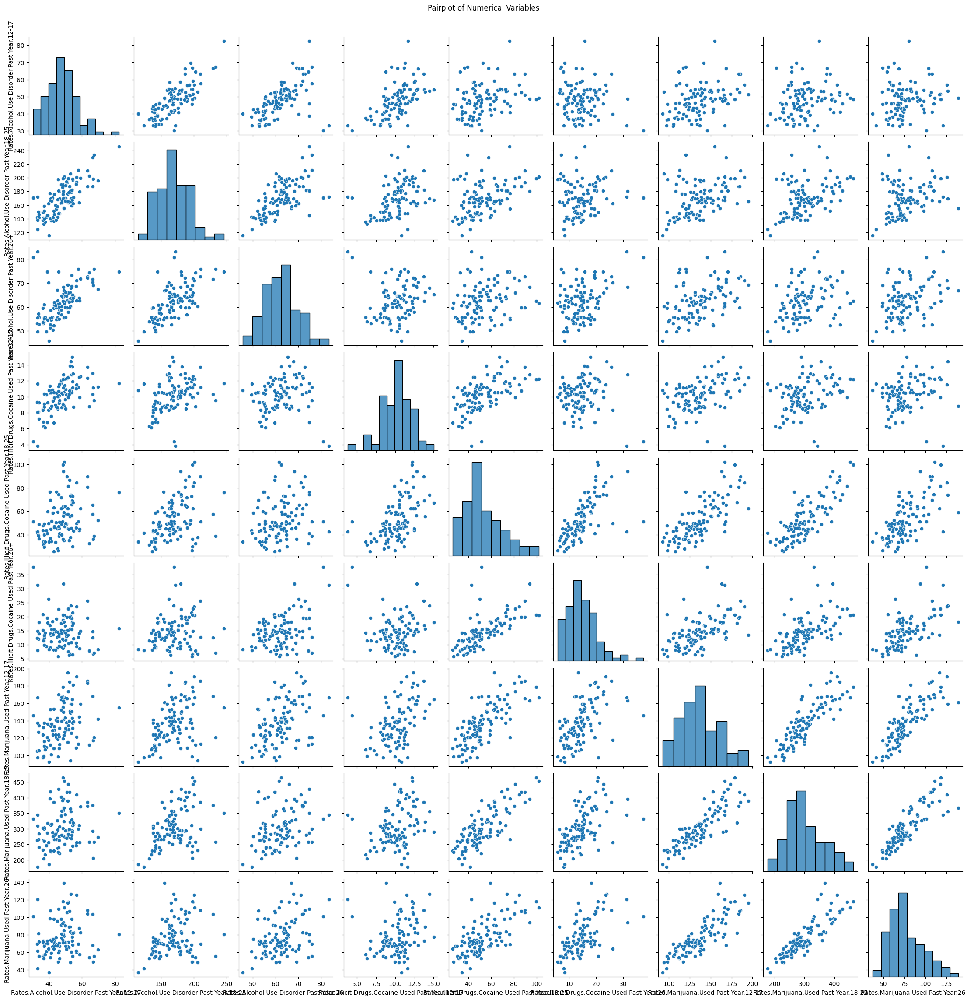

In [ ]:
numerical_vars = df_rates_year_2008_2009.select_dtypes(include=['int64', 'float64']).columns
X_2008_2009 = df_rates_year_2008_2009[numerical_vars].copy()

sns.pairplot(X_2008_2009)
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()

For the 2008-2009 subset, we that the noticeable "outliers" for cocaine are also corresponding with mostly Washington. DC. Furthermore there is only one potential outlier for Montana in the Alcohol Use rates for ages 12-17. We have decided to keep this as well as it isn't really an abnormality either.

In [ ]:
column = df_rates_year_2008_2009['Rates.Alcohol.Use Disorder Past Year.12-17']
Q1 = column.quantile(0.25)
Q3 = column.quantile(0.75)
IQR = Q3 - Q1
Q3 + 1.5 * IQR

70.884875

In [ ]:
df_rates_year_2008_2009.sort_values(by='Rates.Alcohol.Use Disorder Past Year.12-17', ascending=False).head()

,State,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
332,Montana,82.346,245.910,74.862,11.676,76.043,15.806,154.988,349.639,80.393
356,Wyoming,69.572,195.402,67.462,11.269,52.456,8.297,141.906,272.428,62.676
347,South Dakota,67.374,233.478,75.940,9.518,39.079,7.092,120.516,256.695,55.503
321,Iowa,66.700,197.873,69.215,11.132,36.440,6.648,117.243,205.379,48.997
383,Montana,66.455,229.349,71.696,10.310,57.553,12.542,168.268,376.020,103.503


In [ ]:
column = df_rates_year_2008_2009['Rates.Illicit Drugs.Cocaine Used Past Year.26+']
Q1 = column.quantile(0.25)
Q3 = column.quantile(0.75)
IQR = Q3 - Q1
Q3 + 1.5 * IQR

28.232374999999998

In [ ]:
df_rates_year_2008_2009.sort_values(by='Rates.Illicit Drugs.Cocaine Used Past Year.26+', ascending=False).head()

,State,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
314,District of Columbia,30.374,170.425,81.007,4.336,51.417,37.588,145.912,331.630,101.075
345,Rhode Island,48.641,180.264,68.366,12.796,93.927,31.691,163.145,394.751,93.939
365,District of Columbia,33.187,172.128,83.361,3.803,42.613,31.289,166.591,343.925,120.796
346,South Carolina,39.765,162.395,70.259,8.335,49.714,26.208,117.493,255.789,64.040
311,Colorado,63.222,210.276,72.814,13.726,89.401,25.627,185.465,385.898,107.868


### 3.3 Outlier Identification - 3+ Variable Outliers

We looked at PCA to help with multi-dimensional outliers, so we first looked to see that we needed up to 4 components to find out outliers

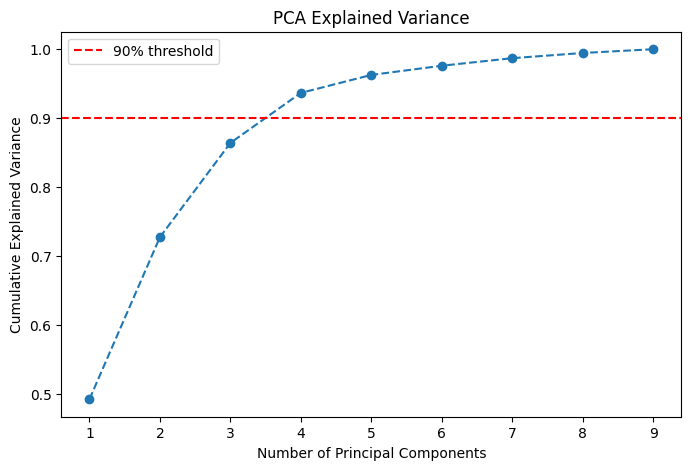

In [ ]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(X_2006_2007)

# Perform PCA
pca = PCA()
pca_result = pca.fit_transform(df_scaled)

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% threshold')
plt.legend()
plt.show()

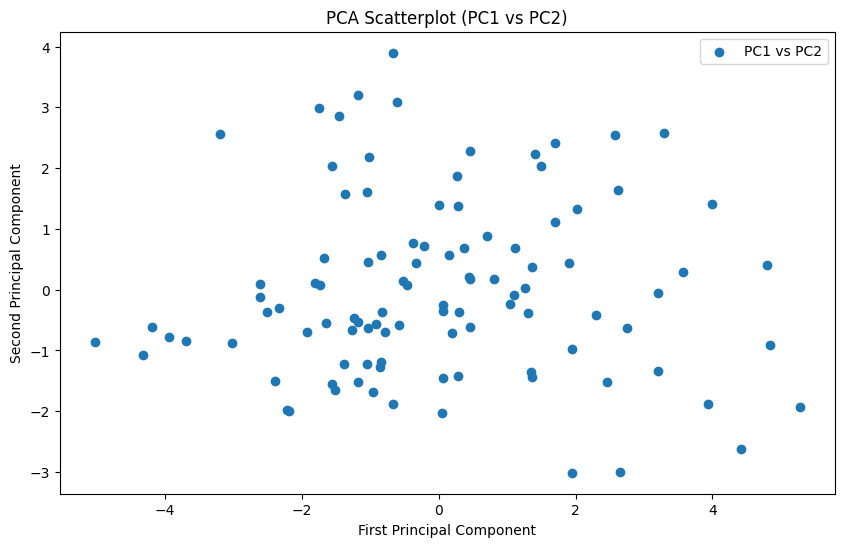

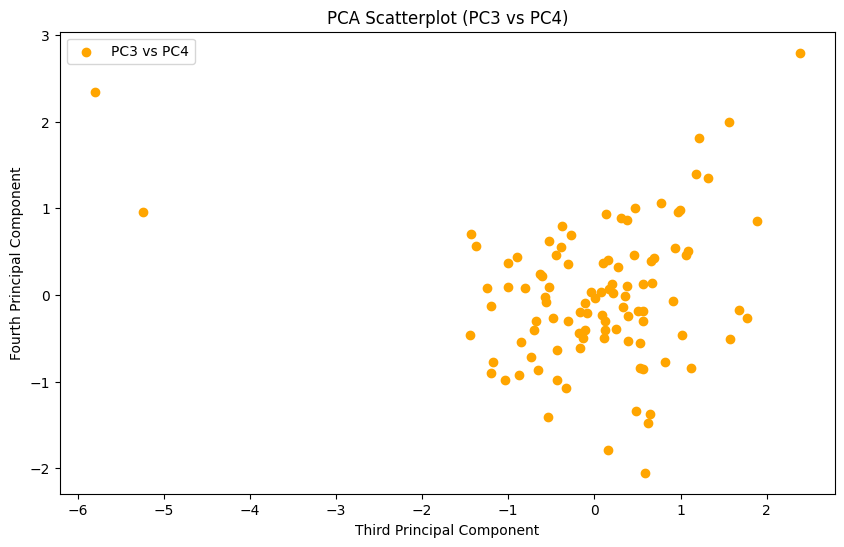

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], label='PC1 vs PC2')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Scatterplot (PC1 vs PC2)')
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 2], pca_result[:, 3], color='orange', label='PC3 vs PC4')
plt.xlabel('Third Principal Component')
plt.ylabel('Fourth Principal Component')
plt.title('PCA Scatterplot (PC3 vs PC4)')
plt.legend()
plt.show()

Unsurprisingly the PCA results also showed DC as the outliers, which we decided to keep

In [ ]:
pc3 = pca_result[:, 2]
outlier_indices_pc3 = np.where(pc3 < -4)[0]
outliers = df_rates_year_2006_2007.iloc[outlier_indices_pc3]
outliers

,State,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
212,District of Columbia,35.900,196.714,85.072,7.523,57.231,52.488,129.952,372.018,110.340
263,District of Columbia,32.611,189.924,80.549,5.966,54.765,42.654,138.453,367.415,111.346


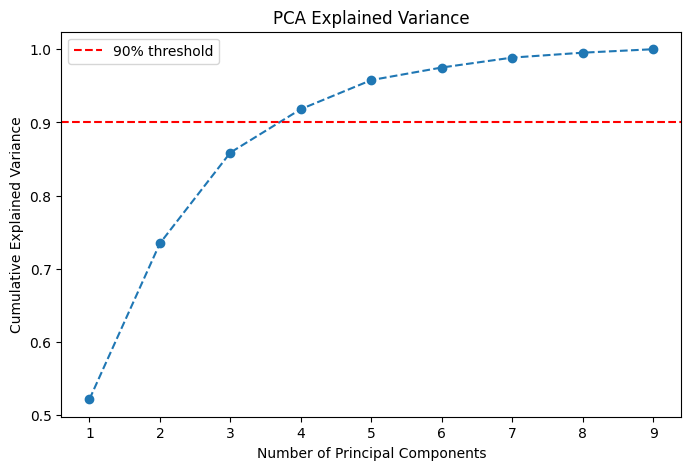

In [ ]:
scaler = StandardScaler()
df_scaled_pca = scaler.fit_transform(X_2008_2009)

pca = PCA()
pca_result = pca.fit_transform(df_scaled_pca)

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% threshold')
plt.legend()
plt.show()

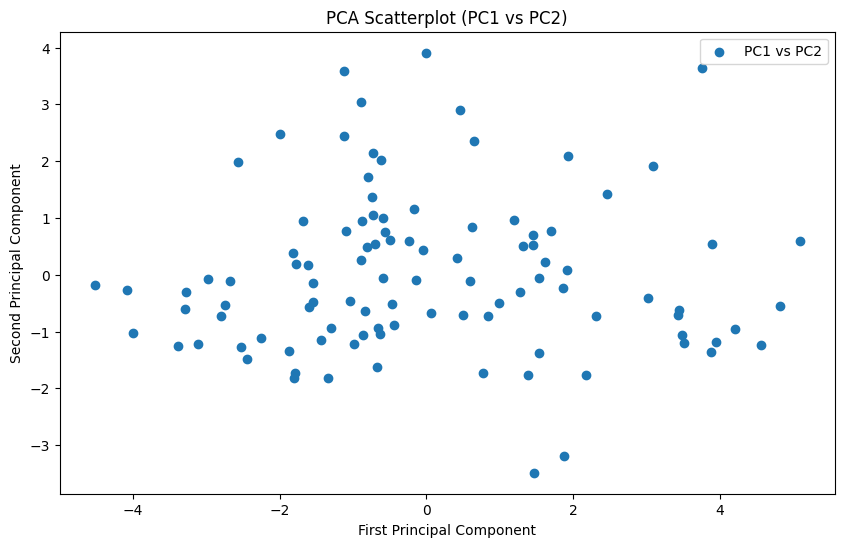

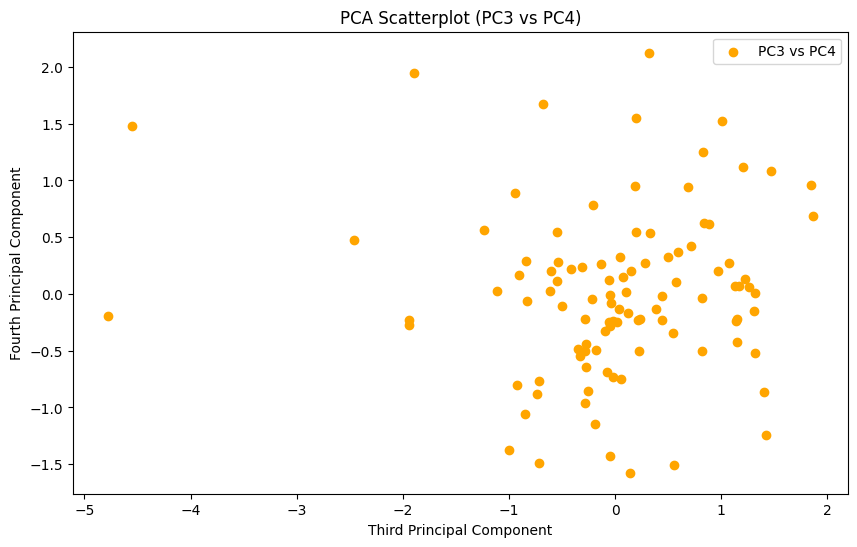

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], label='PC1 vs PC2')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Scatterplot (PC1 vs PC2)')
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 2], pca_result[:, 3], color='orange', label='PC3 vs PC4')
plt.xlabel('Third Principal Component')
plt.ylabel('Fourth Principal Component')
plt.title('PCA Scatterplot (PC3 vs PC4)')
plt.legend()
plt.show()

Same for the second data subset

In [ ]:
pc3 = pca_result[:, 2]
outlier_indices_pc3 = np.where(pc3 < -4)[0]
outliers = df_rates_year_2008_2009.iloc[outlier_indices_pc3]
outliers

,State,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
314,District of Columbia,30.374,170.425,81.007,4.336,51.417,37.588,145.912,331.630,101.075
365,District of Columbia,33.187,172.128,83.361,3.803,42.613,31.289,166.591,343.925,120.796


For the District of Columbia Outliers, particularly related to Alcohol User Disorder and Illicit Cocaine columns, we have decided not to drop them or treat them as anything special in this stage. They may be grouped with some of the other related outliers such as Montana or Alaska as identified by the Pairplot and HAC-single dendogram as a smaller cluster, but for now they are left untouched.

### 3.3 Noise

To determine noise, a good option was to use HAC-Single, especially if we have limited observations

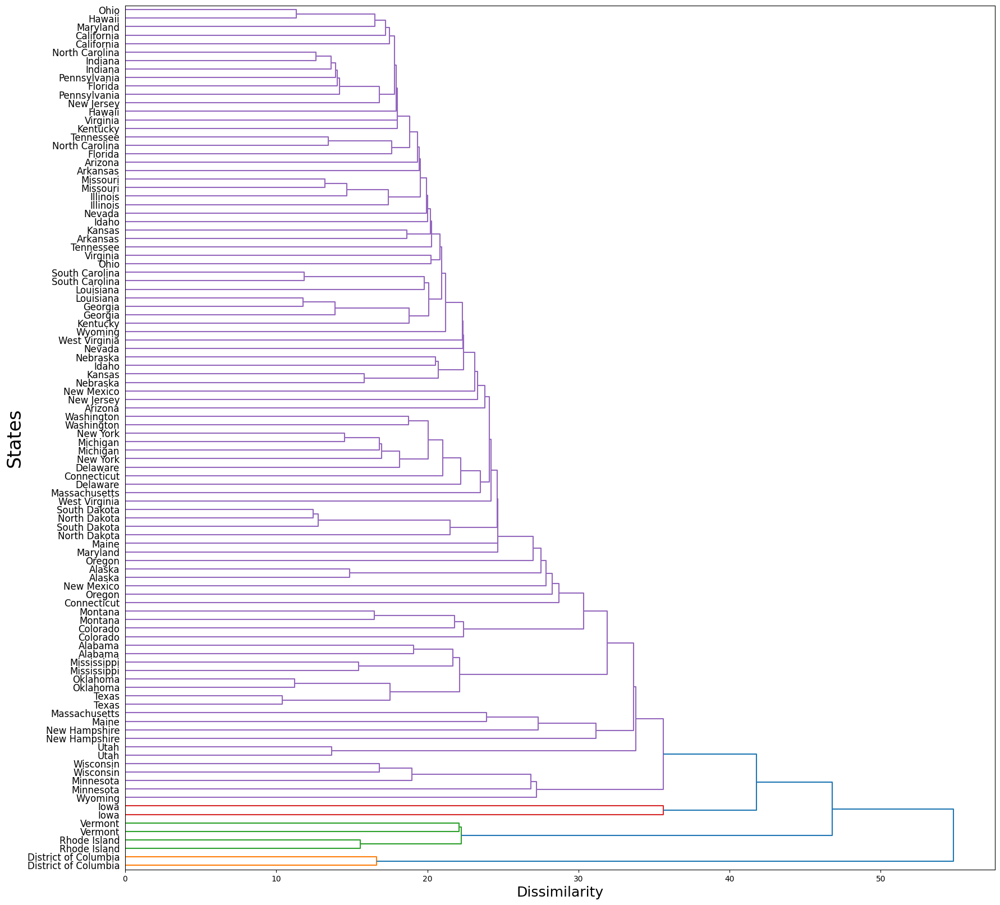

In [ ]:
dm = pdist(X_2006_2007, metric='euclidean')
Z = linkage(dm, method='single')
fig, ax = plt.subplots(figsize=(20, 20))
d = dendrogram(Z, orientation='right', labels=df_rates_year_2006_2007['State'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('States', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

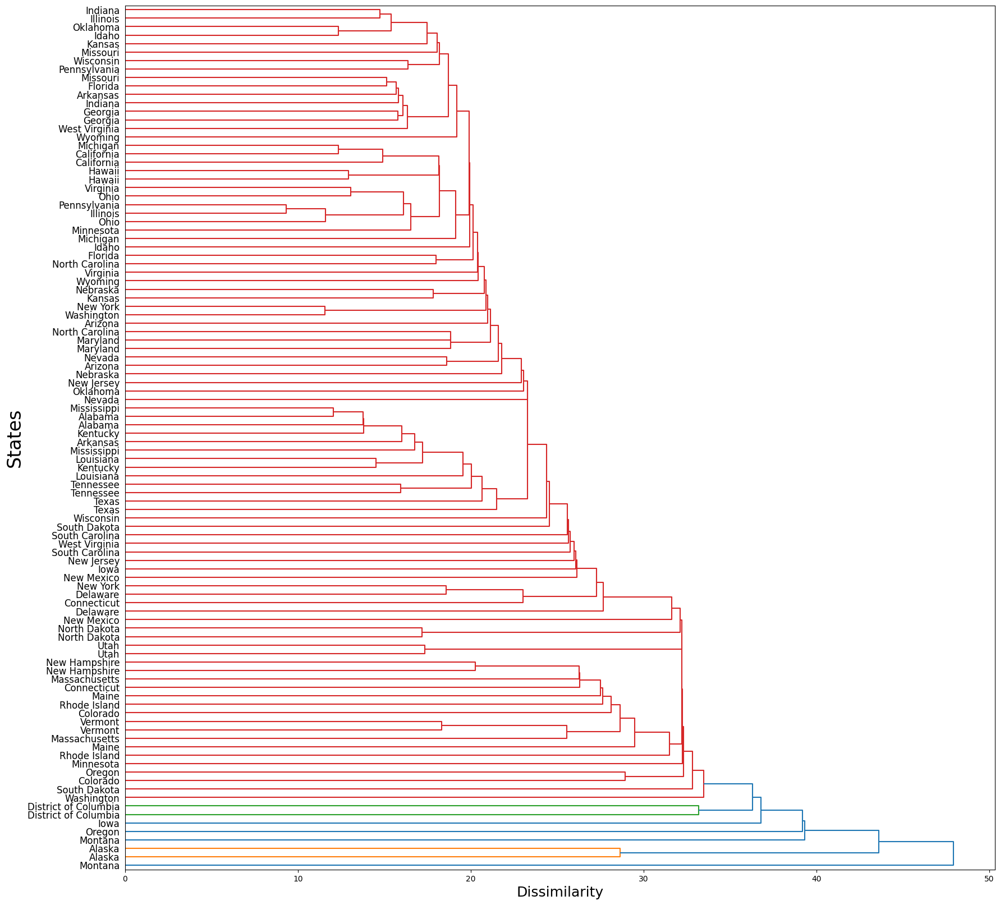

In [ ]:
dm = pdist(X_2008_2009, metric='euclidean')
Z = linkage(dm, method='single')
fig, ax = plt.subplots(figsize=(20, 20))
d = dendrogram(Z, orientation='right', labels=df_rates_year_2008_2009['State'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('States', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

Based on these dendrograms, I wouldn't say we have any non-outlier noise points, especially since many of the observations to last be considered are already outliers we have decided to leave in from previous steps, such as the District of Columbia observations


We did not do any additional data cleaning other than the row filtering from the first part of Part 3

## 4. Basic Descriptive Analytics

Here, we looked at overall distribution, characteristics, and pairwise relationship of the variables.

**Summary statistics**:
- 2006,2007 data has overall higher average for variables for Alcohol and Cocaine usages.
- 2008, 2009 data has overall higher average for variables for Marijuiana usages.

**Number of observations**:
- There are two data points for each states for each group and 51 states total of 102 data points.

**Pairwise relationship**:
- Looking at the correlation heatmap above, we know that there are strong pariwise relationship between certain variable that has similar characteristics. There are very similar variables such as "Rates.Alcohol.Use.Disorder Past Year.12-17" and "Rates.Alcohol.Use.Disorder Past Year.18-25". Therefore, variables with only diferrent in age rage seem but with same concept tend to have strong pairwise relationship.


In [ ]:
X_2006_2007.shape

(102, 9)

In [ ]:
X_2008_2009.shape

(102, 9)

In [ ]:
X_2006_2007.describe()

,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
count,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000
mean,55.125951,180.345127,62.978657,14.340804,65.171902,17.326676,132.128961,288.482333,70.412245
std,10.215640,26.730012,7.619843,3.203494,14.586438,6.397339,20.851738,61.659898,16.751695
min,32.611000,127.423000,46.817000,5.966000,31.554000,6.888000,87.651000,168.109000,37.151000
25%,47.675000,163.045750,56.108750,12.452500,56.741750,14.393750,116.805750,249.413500,58.805500
50%,54.818000,178.564500,63.136000,14.147000,62.532000,16.535500,128.627000,275.576500,69.651000
75%,61.916250,194.370500,67.342750,15.889000,74.667500,19.283500,142.034750,322.999750,77.603000
max,81.705000,240.881000,85.072000,24.444000,105.060000,52.488000,185.242000,445.644000,113.748000


In [ ]:
X_2008_2009.describe()

,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+
count,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000
mean,48.067275,169.950245,62.266186,10.199618,53.243520,14.650647,137.186000,303.249314,77.285912
std,9.315835,24.173387,7.289376,1.971179,16.864472,5.675246,23.943858,61.932770,20.469352
min,30.374000,115.325000,45.753000,3.803000,26.142000,5.760000,92.689000,177.003000,37.015000
25%,41.311750,150.553000,55.748500,8.919000,41.369000,10.913000,120.511500,262.521000,63.382250
50%,48.325500,168.004500,62.119000,10.376000,49.584000,14.034500,136.123500,292.752500,71.979500
75%,53.141000,187.098250,66.220750,11.319250,62.923500,17.840750,153.128000,343.214000,89.010250
max,82.346000,245.910000,83.361000,15.019000,101.738000,37.588000,195.308000,463.466000,139.240000


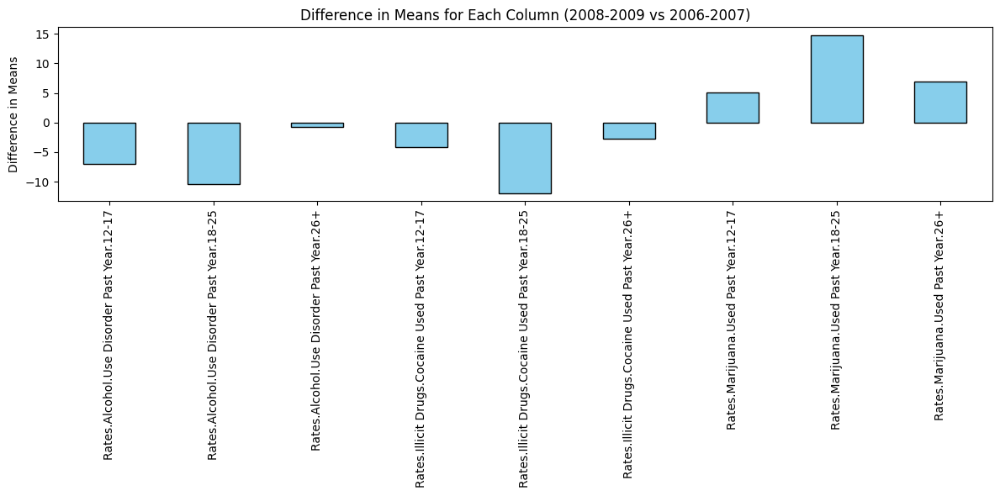

In [ ]:
mean_2006_2007 = X_2006_2007.mean()
mean_2008_2009 = X_2008_2009.mean()
mean_difference = mean_2008_2009 - mean_2006_2007
plt.figure(figsize=(12, 6))
mean_difference.plot(kind='bar', color='skyblue', edgecolor='black')
plt.ylabel('Difference in Means')
plt.title('Difference in Means for Each Column (2008-2009 vs 2006-2007)')
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
df_rates_year_2006_2007['State'].value_counts()

,count
State,
Alabama,2
Pennsylvania,2
Nevada,2
New Hampshire,2
New Jersey,2
New Mexico,2
New York,2
North Carolina,2
North Dakota,2


In [ ]:
df_rates_year_2008_2009['State'].value_counts()

,count
State,
Alabama,2
Pennsylvania,2
Nevada,2
New Hampshire,2
New Jersey,2
New Mexico,2
New York,2
North Carolina,2
North Dakota,2


In [ ]:
df_rates['Year'].unique() # 2002-2018

array([2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018])

In [ ]:
df_rates_2006_2007 = df_rates_year[df_rates_year["Year"].isin([2006, 2007])]
df_rates_2008_2009 = df_rates_year[df_rates_year["Year"].isin([2008, 2009])]

In [ ]:
df_rates_2006_2007['Year'].value_counts()

,count
Year,
2006,51
2007,51


In [ ]:
df_rates_2008_2009['Year'].value_counts()

,count
Year,
2008,51
2009,51


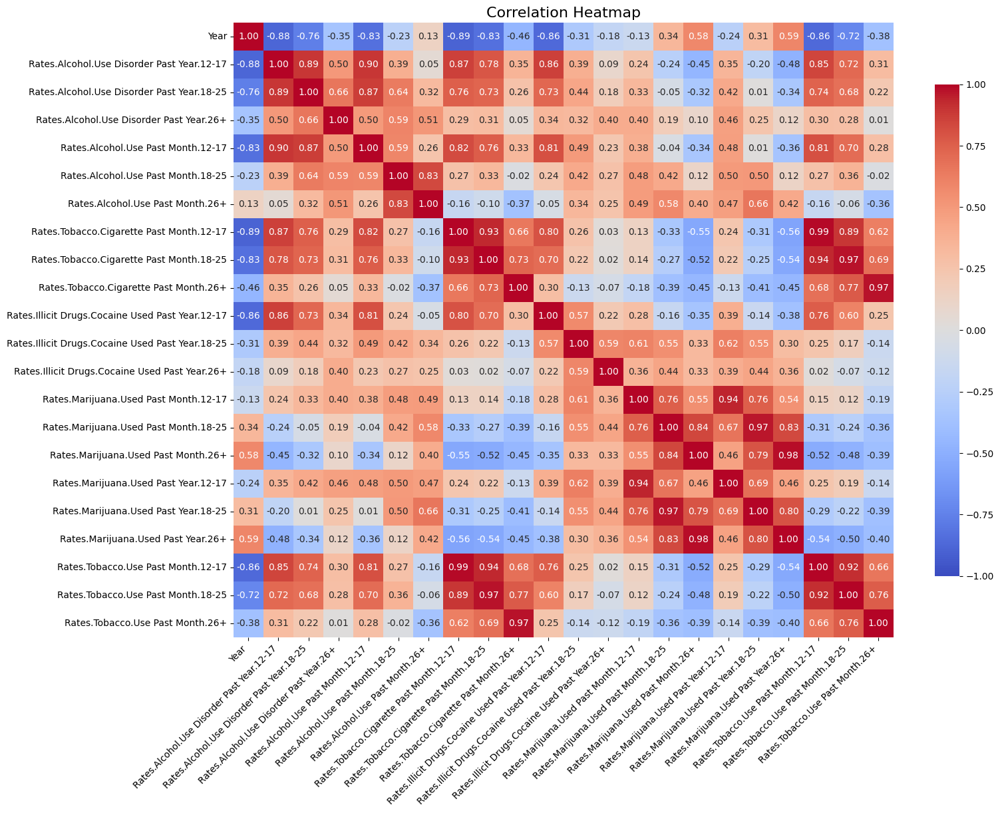

In [ ]:
# Is there any strong pairwise relationship between the variables in the dataset?
# pairwise relationship?
df_numerical= df_rates.drop(columns='State')
corr_matrix= df_numerical.corr()
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            annot_kws={"size": 10}, cbar_kws={"shrink": 0.8})
plt.title("Correlation Heatmap", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.show()

## 5. Scaling Decisions

Motivation: We chose to scale our variables because the descriptive analysis showed that their ranges vary slightly, and scaling can improve the performance of clustering algorithms.

In [ ]:
df_rates_year_2006_2007_numeric = df_rates_year_2006_2007.drop(columns=['State'])
scaler = StandardScaler()
df_scaled_no_label = scaler.fit_transform(df_rates_year_2006_2007_numeric)
df_scaled_no_label = pd.DataFrame(df_scaled_no_label, columns=df_rates_year_2006_2007_numeric.columns)
df_scaled_label = df_scaled_no_label.copy()
df_scaled_label['State'] = df['State']

df_rates_year_2008_2009_numeric = df_rates_year_2008_2009.drop(columns=['State'])
scaler = StandardScaler()
df_scaled_no_label2 = scaler.fit_transform(df_rates_year_2008_2009_numeric)
df_scaled_no_label2 = pd.DataFrame(df_scaled_no_label, columns=df_rates_year_2008_2009_numeric.columns)
df_scaled_label2 = df_scaled_no_label.copy()
df_scaled_label2['State'] = df['State']

## 6. Clusterability and Clustering Structure

Clusterability
- The dataset is clusterable. The t-SNE plot with a perplexity value of 30 and random state 88 suggests that the dataset can be grouped into 4 to 5 clusters. This is because we can observe multiple distinct groups spread across the plot, although they are not perfectly separated.
- Two groups(2006-2007 and 2008-2009 did not have much difference) in t-SNE plot

number of clusters
- There are 4 to 5 noticeable clusters:
Several mid-sized, well-separated clusters across the center and top portions of the plot.
A smaller cluster appears at the bottom-right, slightly separated from the others.
Additional clusters can be observed as more loosely spread-out points, indicating smaller groupings.
- The dendrograms for 2006-07 and 2008-09 confirm hierarchical relationships with smaller clusters merging into larger ones at increasing dissimilarity thresholds. Both t-SNE and hierarchical clustering support that the dataset can be grouped meaningfully.

Shape
- The clusters in the t-SNE plot do not appear perfectly spherical. Some clusters exhibit irregular shapes, while others have a more compact, rounded structure.

Size
- The clusters are uneven in size. Some clusters are larger and more prominent, particularly those in the middle and upper sections of the plot. In contrast, smaller clusters are visible toward the bottom-right and scattered across the center.

Seperation
- The clusters are not well-separated overall. While some clusters, especially at the bottom-right, appear more isolated, other groups tend to overlap or are loosely defined. The points at the center also show close proximity, suggesting less clear boundaries.

Nested Cluster Relationship
- The dendrogram shows smaller clusters of states forming at lower levels of dissimilarity, which progressively merge into larger, broader clusters as the dissimilarity threshold increases.

Clustering Structure and Attribute Associate
- Based on the distribution of points, it is likely that specific attributes influence the clustering structure. The relatively tight and dispersed groupings suggest that some attributes strongly correlate with specific clusters, potentially reflecting meaningful patterns within the dataset.

Understandng the t-SNE algorithm
- Caution: There are 4 original dataset properties that t-SNE plots are not able to reveal and those are: sparsity, exact distance between data points, nested relationships, and global structure.



t-SNE plot for year 2006, 2007

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


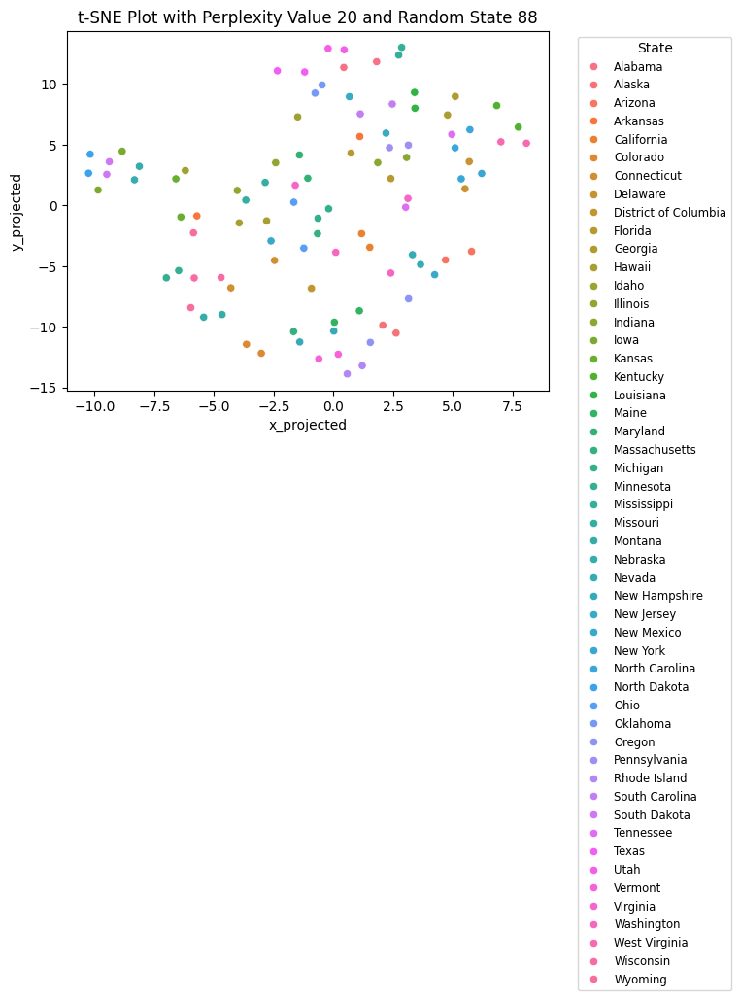

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


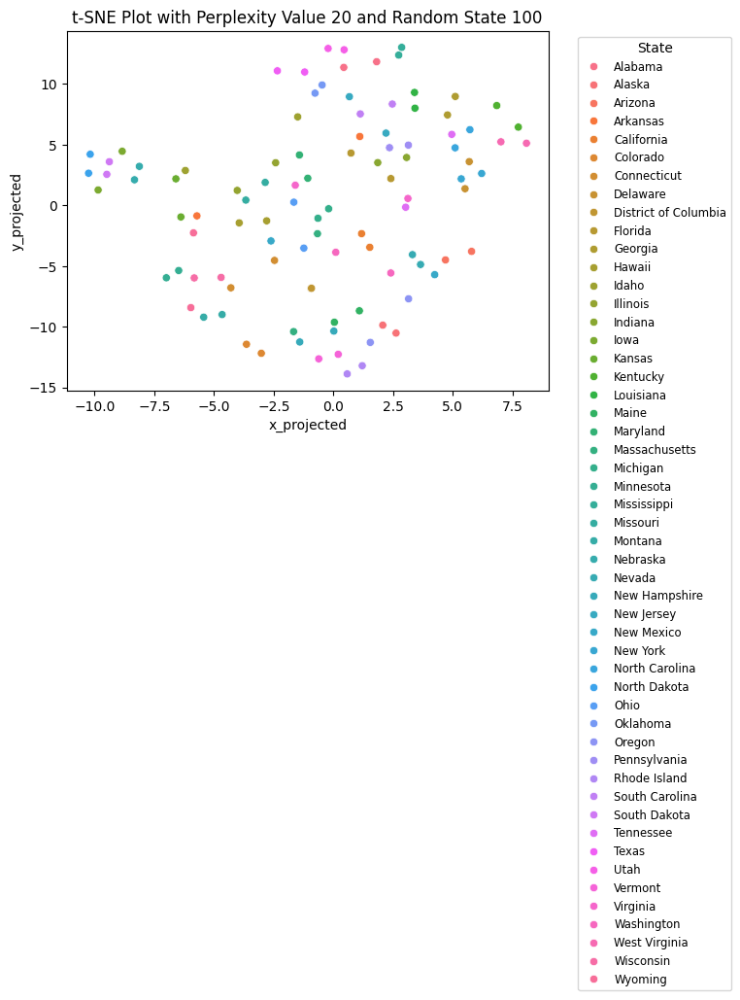

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


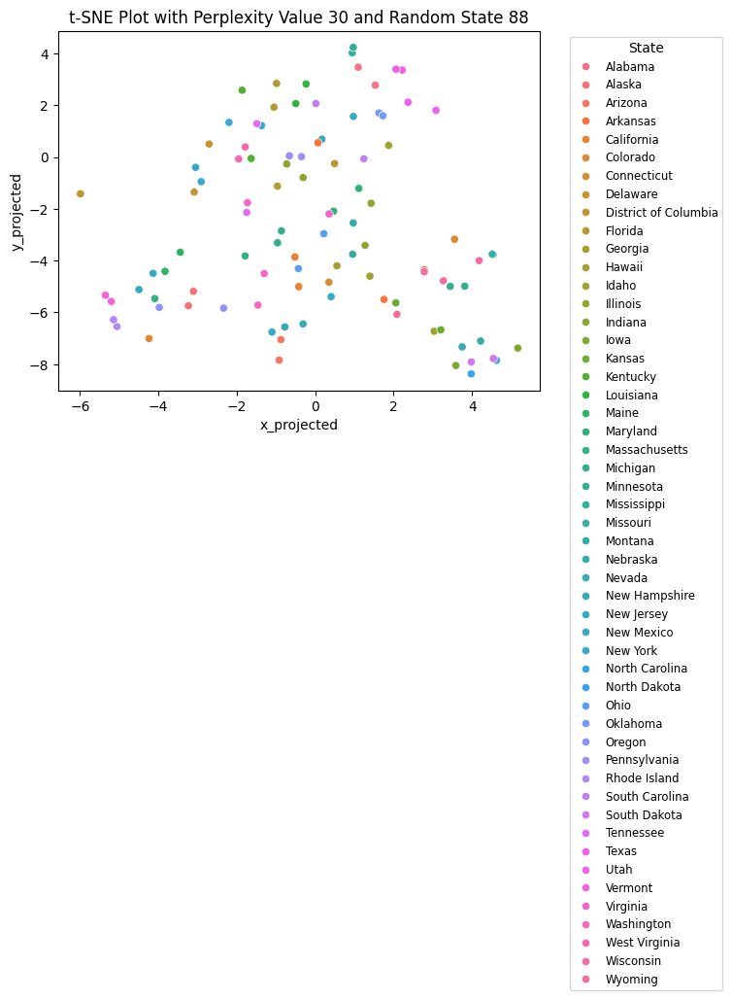

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


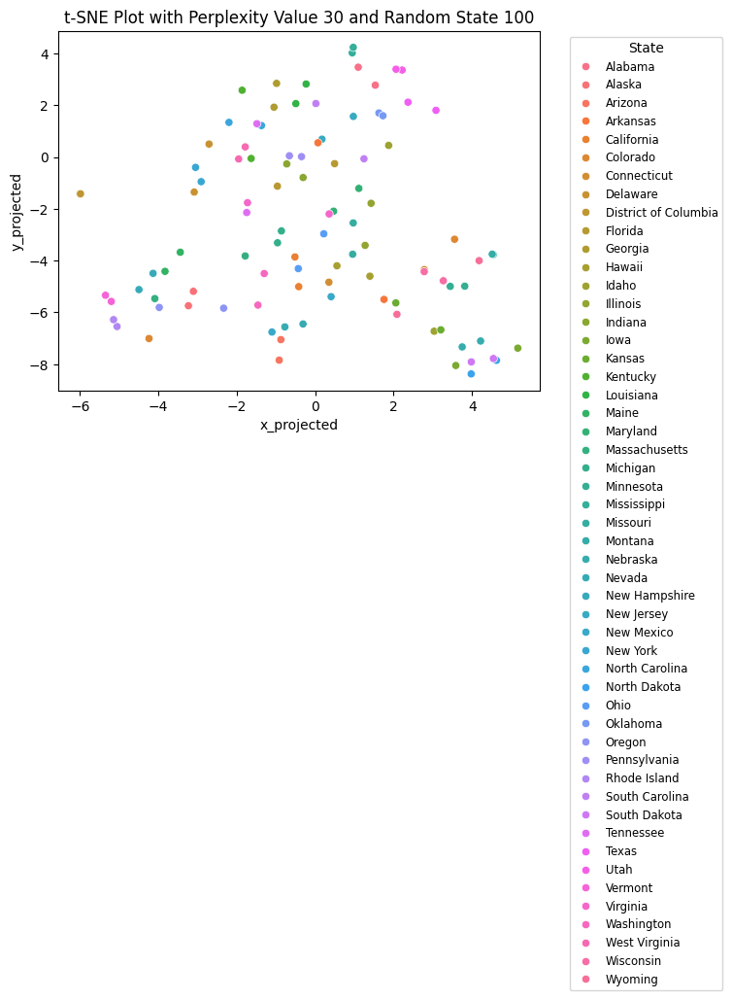

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


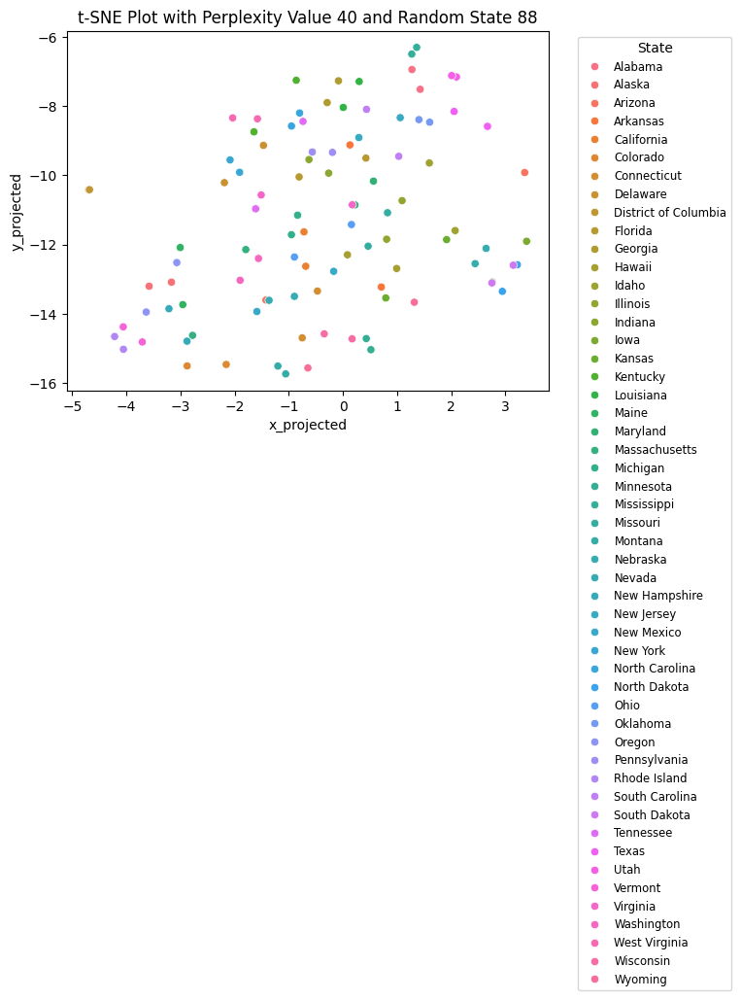

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


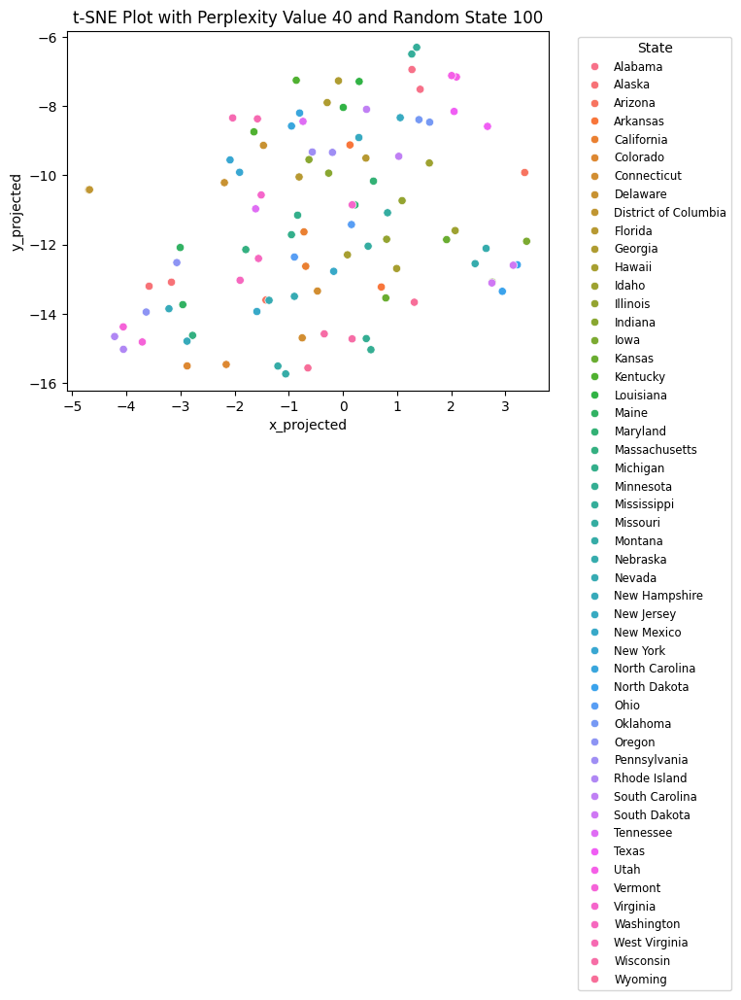

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


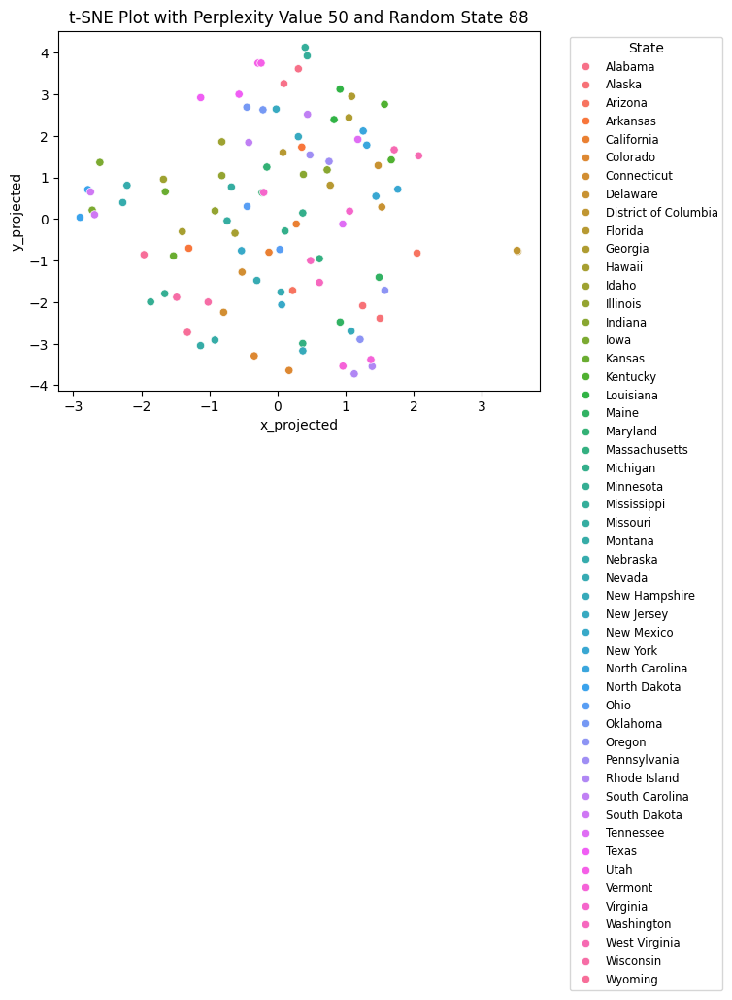

<ipython-input-44-5a132e152ce5>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


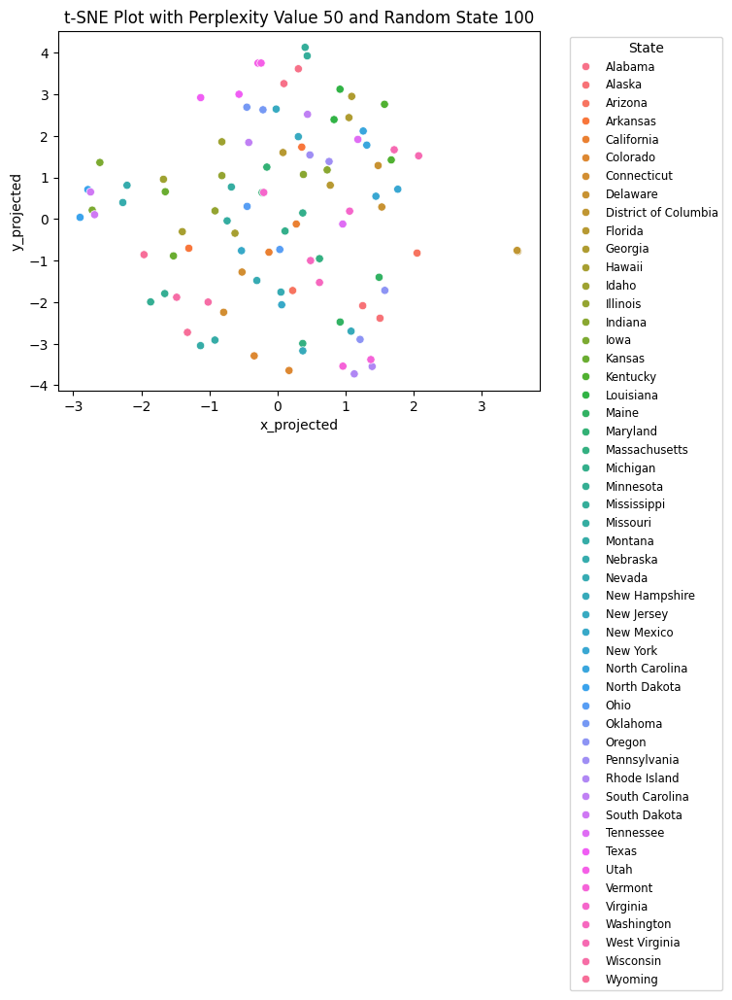

----------------------------------------


In [ ]:
for perp in [20, 30, 40, 50]:
    for rs in [88, 100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df_scaled_no_label)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df_scaled_label, df_tsne], axis=1)
        sns.scatterplot(x='x_projected', y='y_projected', hue='State', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (perp, rs))

        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='State', fontsize='small')
        plt.tight_layout()
        plt.show()
print('----------------------------------------')

t-SNE plot for year 2008, 2009

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


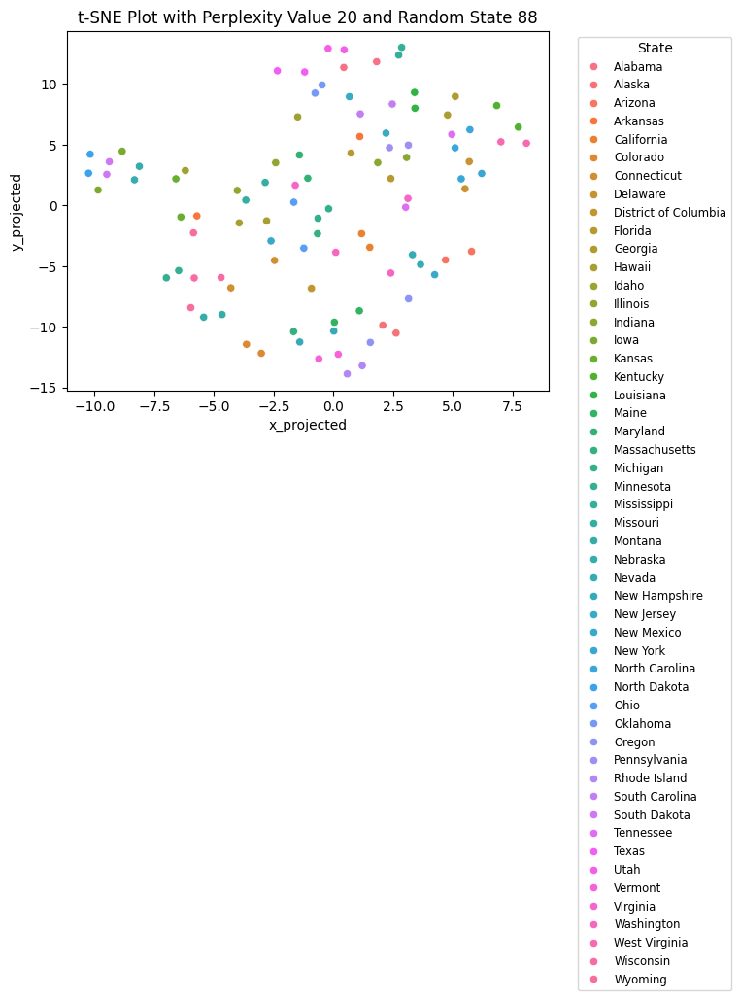

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


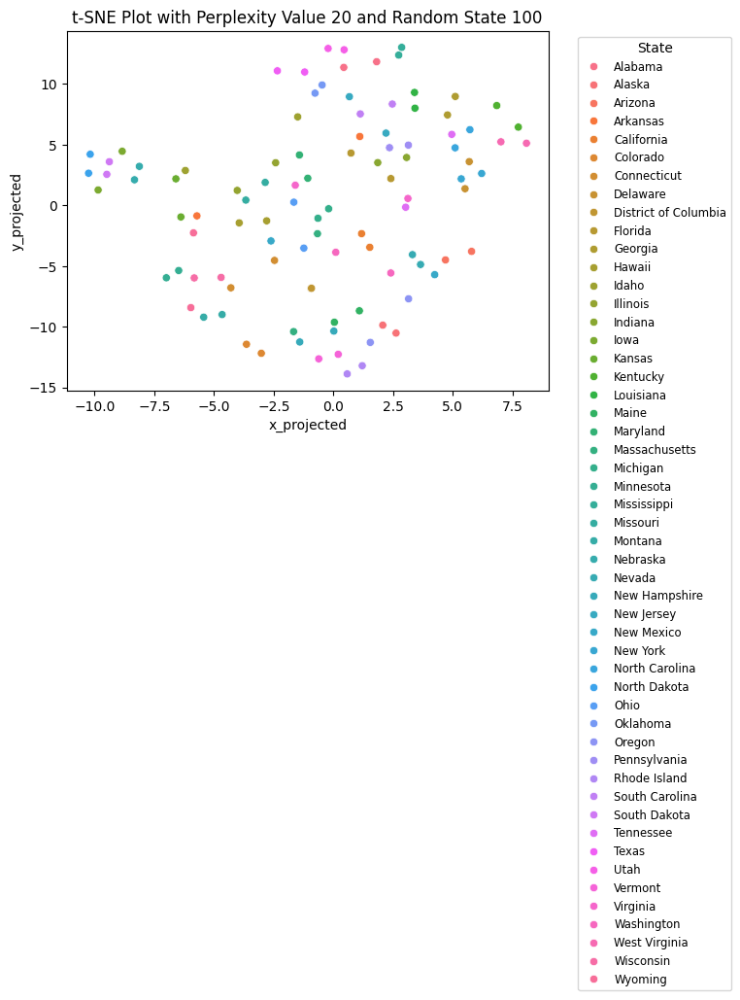

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


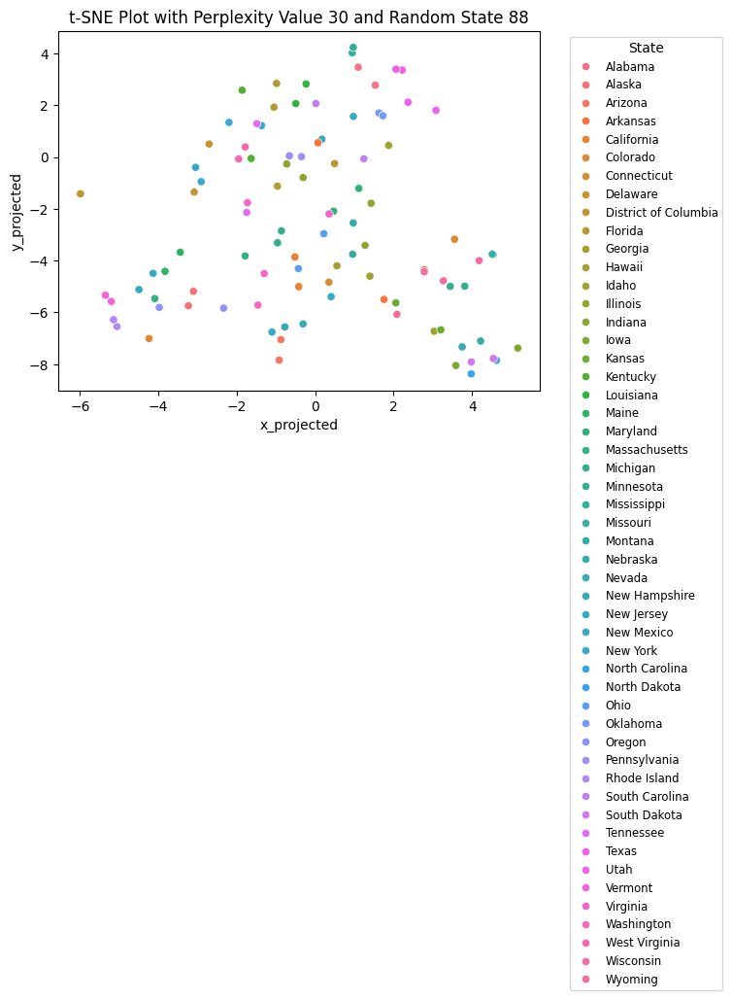

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


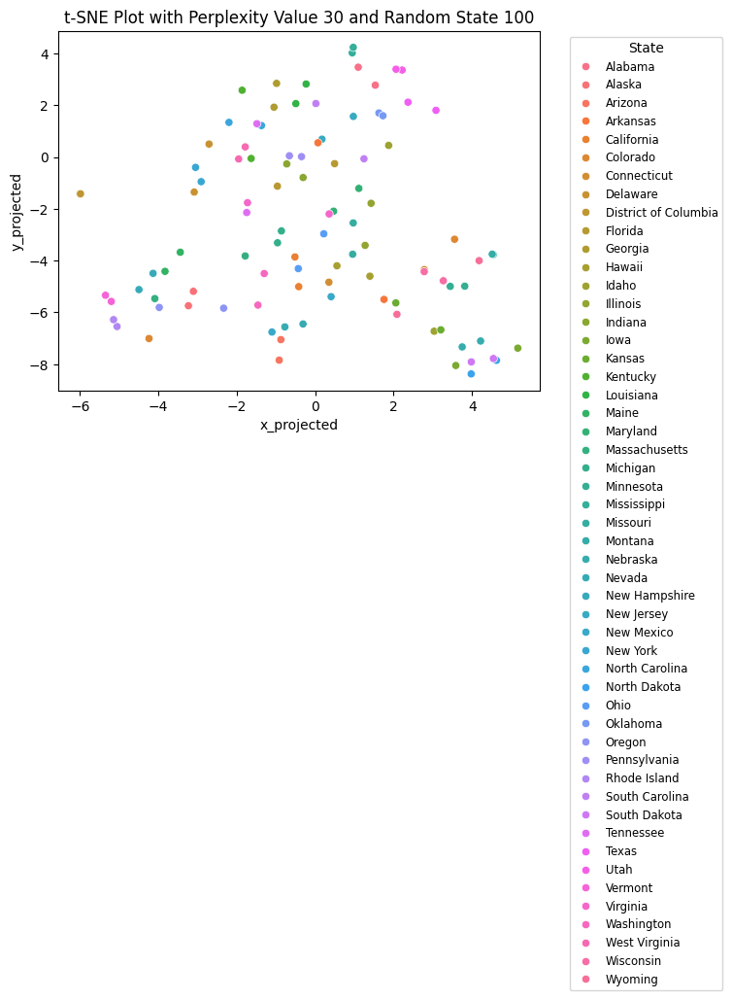

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


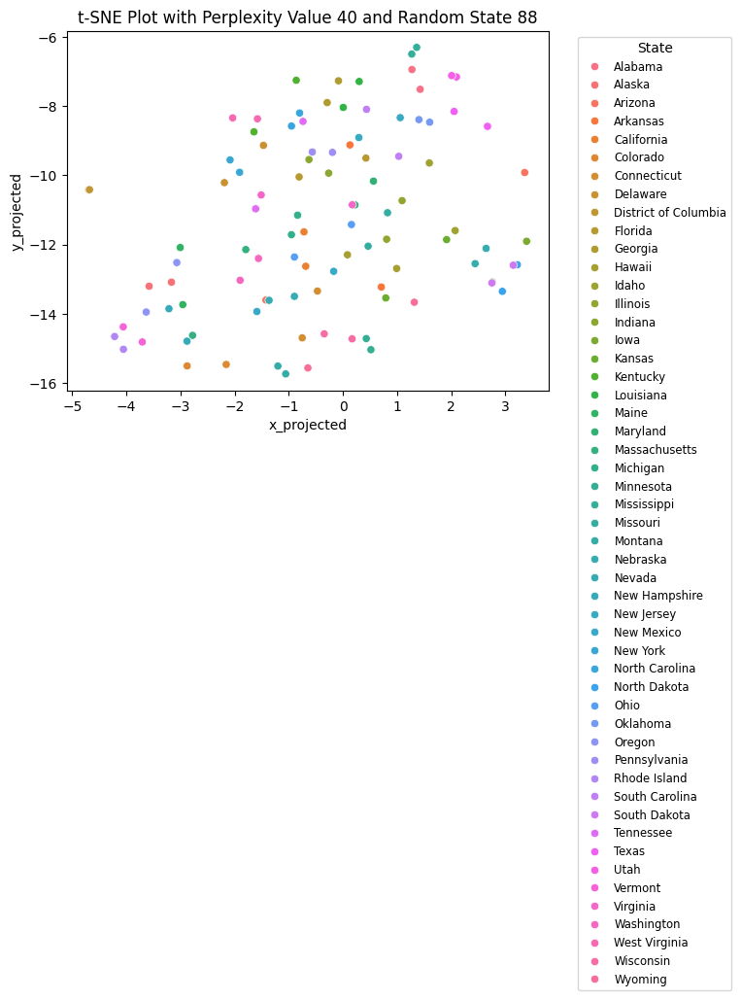

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


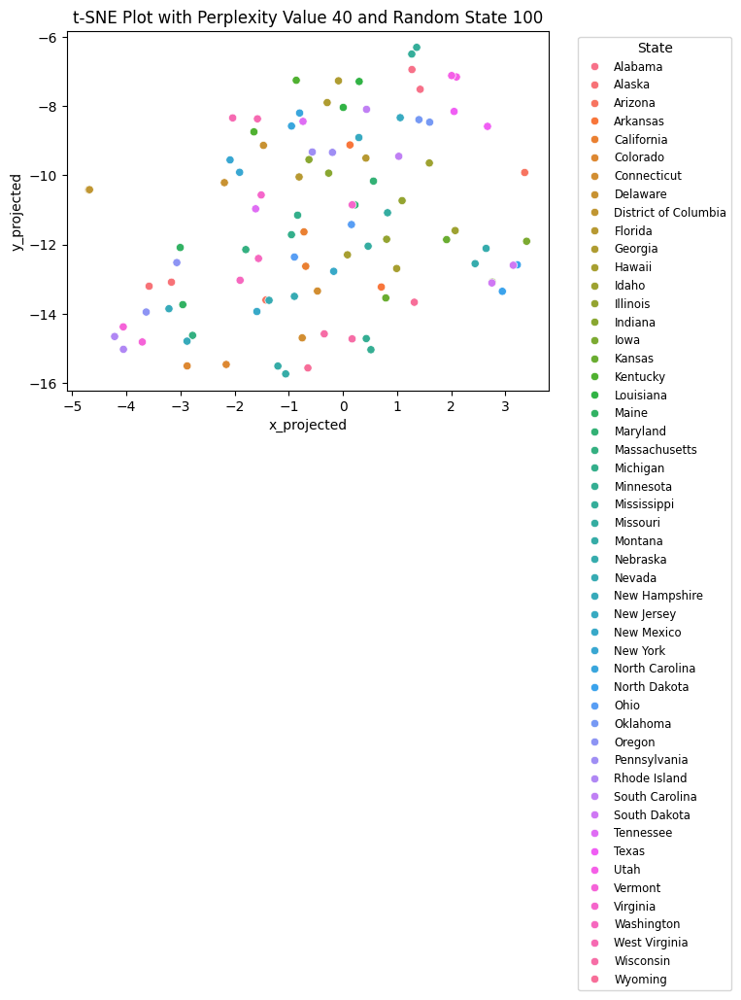

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


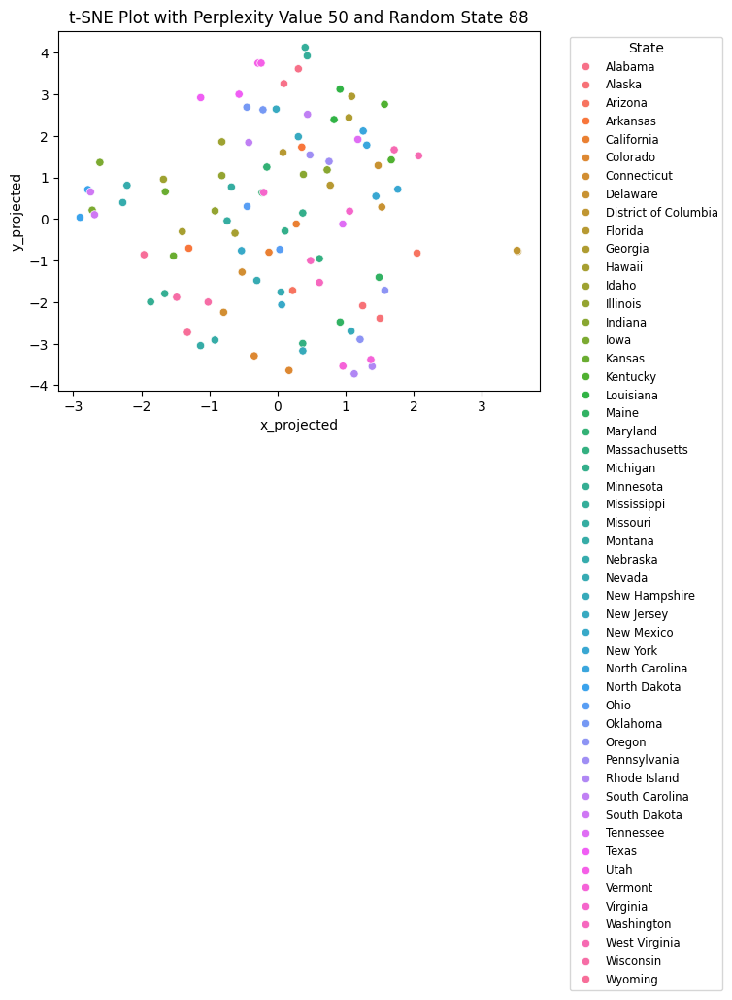

<ipython-input-45-2688fd256c01>:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


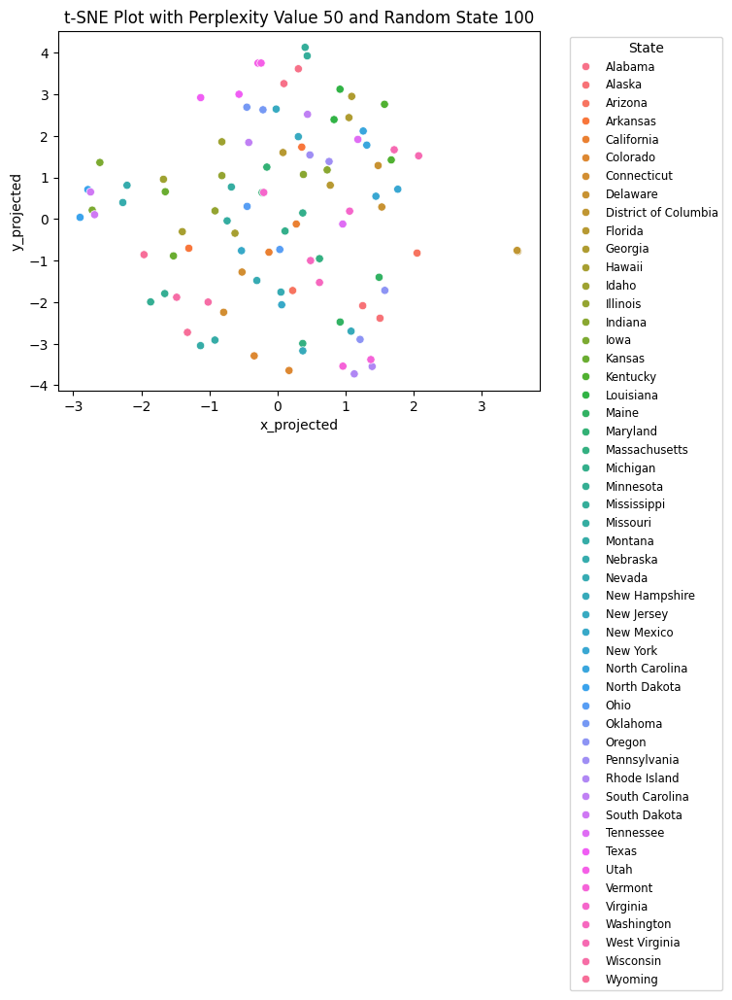

----------------------------------------


In [ ]:
for perp in [20, 30, 40, 50]:
    for rs in [88, 100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df_scaled_no_label2)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df_scaled_label2, df_tsne], axis=1)
        sns.scatterplot(x='x_projected', y='y_projected', hue='State', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (perp, rs))

        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='State', fontsize='small')
        plt.tight_layout()
        plt.show()
print('----------------------------------------')

Perplexity and random state value which best represent the clustering structure of the dataset:

- Year 2006, 2007

<ipython-input-46-05c3036e098f>:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


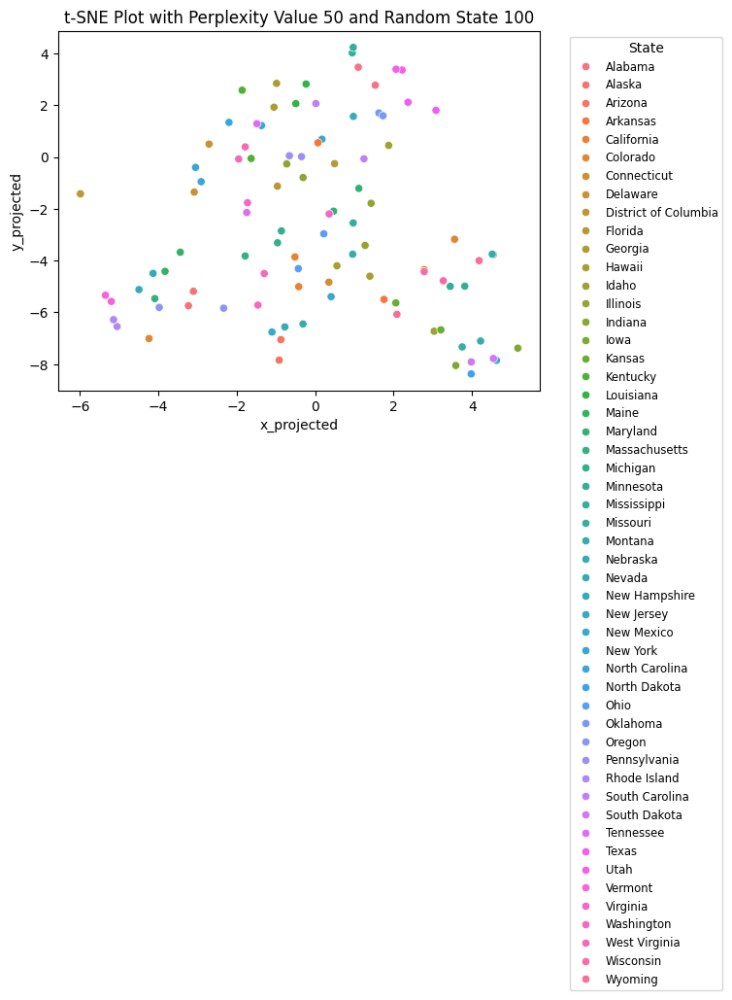

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=88)
data_tsne = tsne.fit_transform(df_scaled_no_label)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df_scaled_label, df_tsne], axis=1)
sns.scatterplot(x='x_projected', y='y_projected', hue='State', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (perp, rs))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='State', fontsize='small')
plt.tight_layout()
plt.show()

- Year 2008, 2009

<ipython-input-47-4f841c5dc520>:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


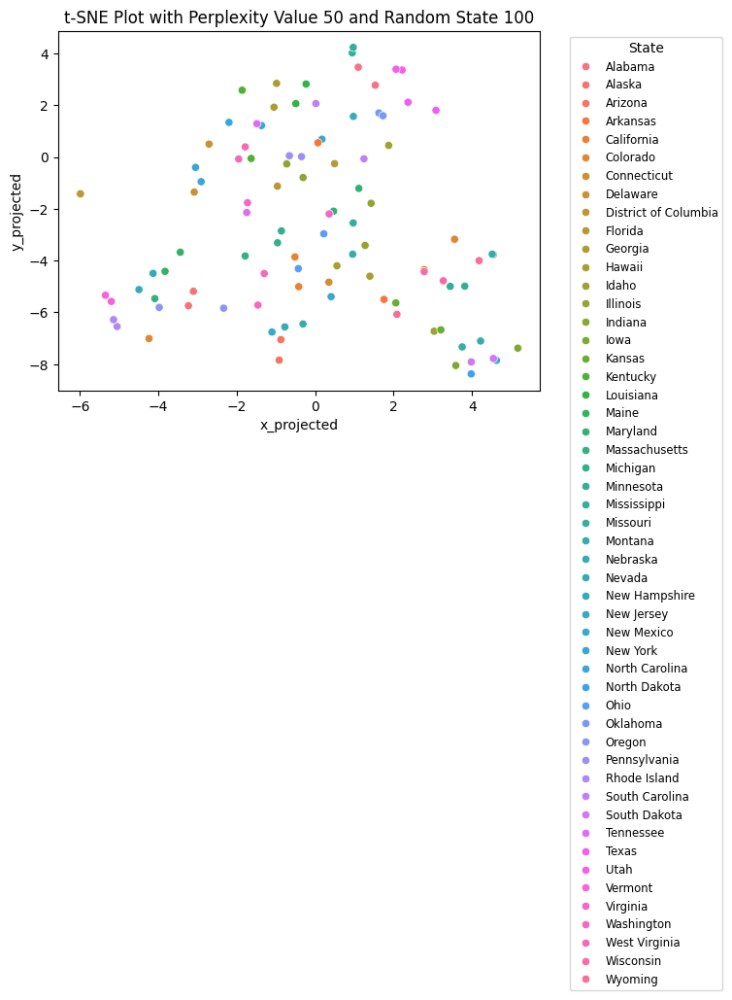

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=88)
data_tsne = tsne.fit_transform(df_scaled_no_label2)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df_scaled_label2, df_tsne], axis=1)
sns.scatterplot(x='x_projected', y='y_projected', hue='State', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (perp, rs))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='State', fontsize='small')
plt.tight_layout()
plt.show()

## 7. Clustering Algorithm Selection Motivation

**Clustering Algorithm 1: Fuzzy-C means**

This method was chosen for this dataset because it aligns well with the inherent complexity of drug-related data. C-Means allows for soft clustering, where observations from one group or a state can partially belong to multiple clusters, or for example a drug pattern is prevalent in multiple states, and thus it may be highly beneficial to conduct a more flexible clustering. We could get a more realistic representation of the patterns, accommodating both the gradual and abrupt transitions often seen in times of economic crises.

Additionally, in terms of properties, C-Means is well-suited for datasets that are not very well-separated and may contain some sparsity. In this dataset, clusters are unlikely to have extremely clear boundaries due to variations in economic impact, state policies, and cultural factors affecting drug use. C-Means mitigates these challenges by assigning membership scores to observations in multiple clusters. This less rigid approach could be good for uncovering patterns in substance abuse rates across states before and after the economic crisis.

---

**Clustering Algorithm 2: Hierarchical Agglomertive Clustering- Ward's**

HACs are effective in identifying clusters with minimal internal variability and in uncovering clustering structures at multiple levels. Since the t-SNE analysis suggested the data may have around three clusters, but not too clearly defined, being flexible with the number of clusters was important, which can be determined using the dendrogram.

The data was numerical, which makes calculating Euclidean distance simpler than with categorical data and optimal for running HAC. Although the separation was not very distinct, it was still apparent (i.e., there were clusters, but many points in between the clusters were nearly equidistant from others). Most importantly, there was minimal noise and few extreme outliers, making HAC an effective choice. Finally, since there were not many data points to work with, the computationally intensive HAC Ward’s algorithm was a good fit.

Among the different HAC types, Ward’s was the best choice. It outperformed the other HAC methods by achieving higher silhouette scores and better capturing the inherent clusters in the data.



**Follow-Up**: We have already used Fuzzy-C to deal with potentially not well separated observations and a Hiearchical result in the form of Ward linkage

## 8. Clustering Algorithm #1 Fuzzy - C



Parameter Selection: Parameter Selection: From the TSNE graphs, we are looking at around 3 clusters. Since our dataset is a little sparse and moderately well separated, we would be looking at a fuzziness parameter around the default of 2, so I will start looking at values from 1.5 to 2.5 (from moderately separate to many overlapping observations)


In [ ]:
X = df_scaled_no_label.copy()
X2 = df_scaled_no_label2.copy()

We first create an analysis of the parameters for both 2006-2007 and 2008-2009

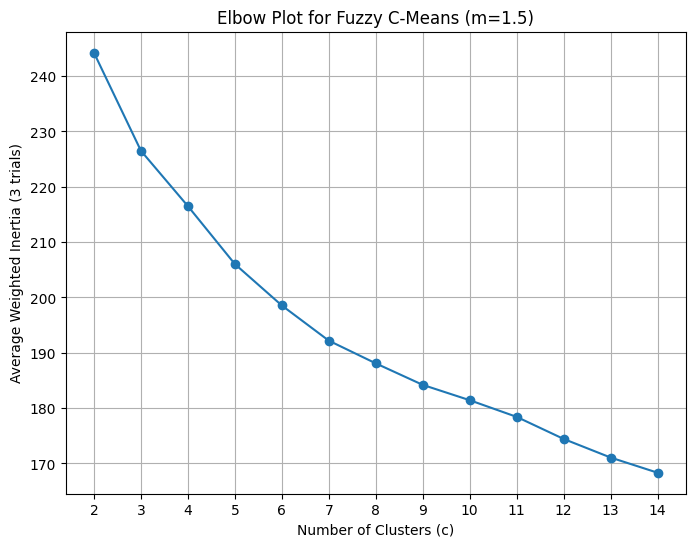

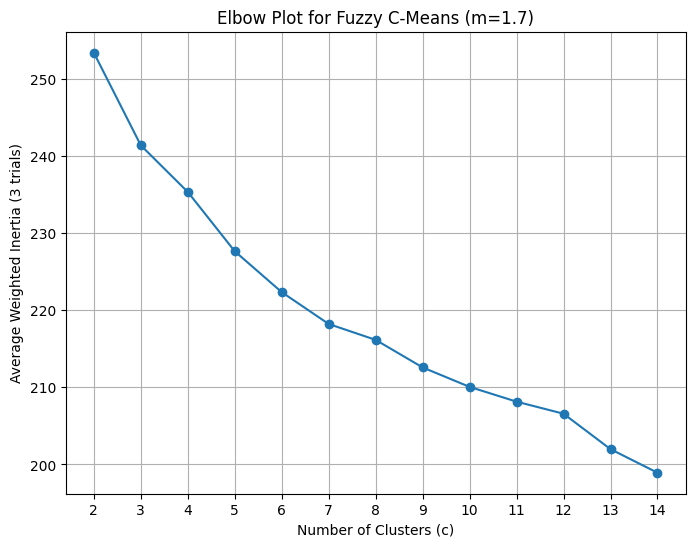

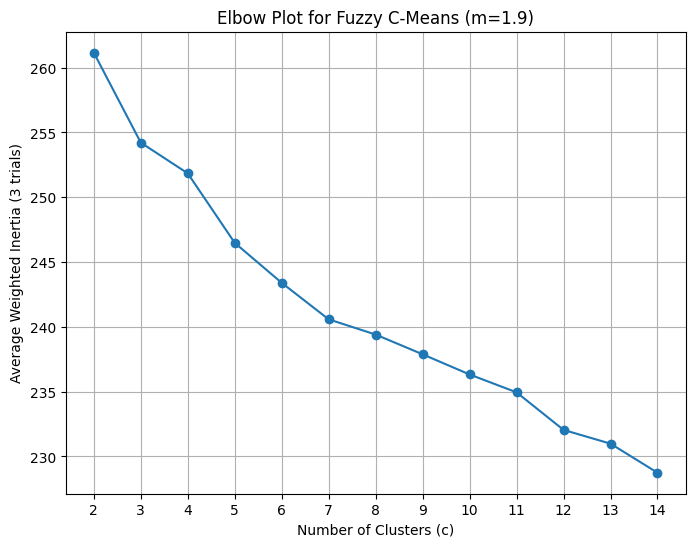

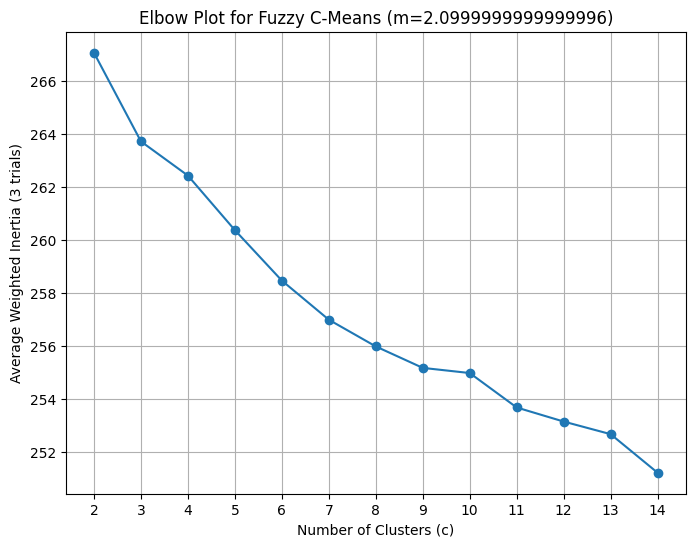

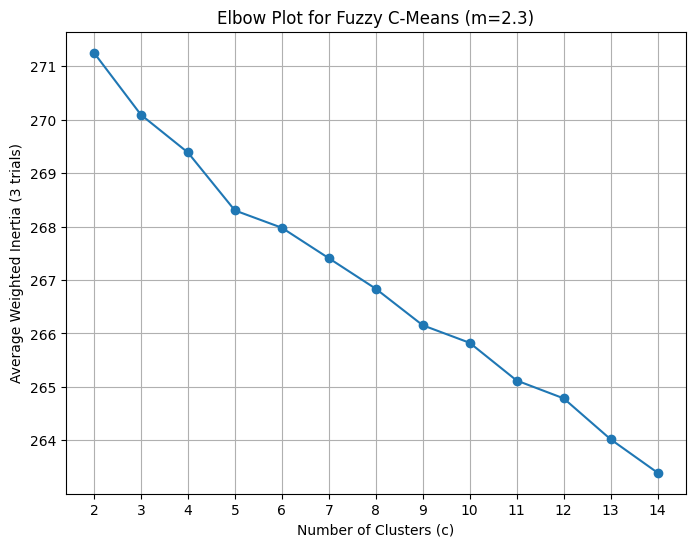

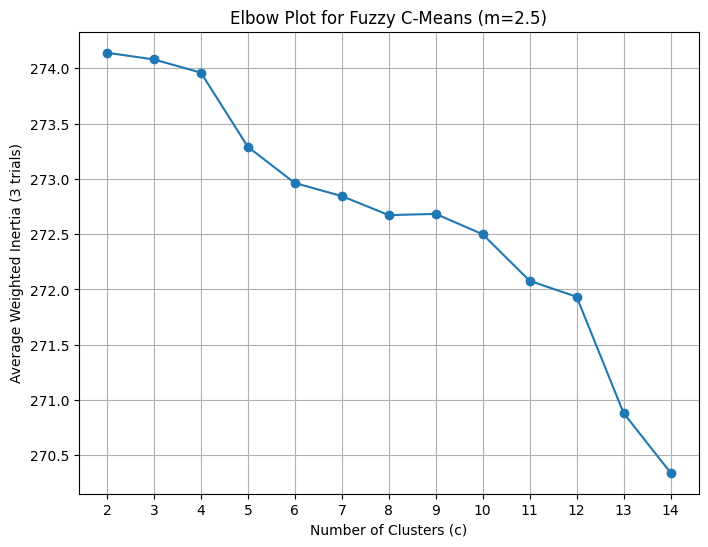

In [ ]:
m_values = np.arange(1.5, 2.6, 0.2)
cluster_range = range(2, 15)
for m in m_values:
    weighted_inertia_list = []

    for c in range(2, 15):
        sub_inertia_list = []

        for i in range(3):
            centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(
                X.T, c=c, m=m, error=1e-6, maxiter=20000, seed=100 + i
            )
            sub_inertia_list.append(np.sum(W * dist_mat))

        weighted_inertia_list.append(np.mean(sub_inertia_list))

    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, weighted_inertia_list, marker='o', linestyle='-')
    plt.xlabel('Number of Clusters (c)')
    plt.xticks(cluster_range)
    plt.ylabel('Average Weighted Inertia (3 trials)')
    plt.title(f'Elbow Plot for Fuzzy C-Means (m={m})')
    plt.grid(True)
    plt.show()

## 8. Clustering Algorithm #1 Fuzzy - C



Parameter Selection: Parameter Selection: From the TSNE graphs, we are looking at around 3 clusters. Since our dataset is a little sparse and moderately well separated, we would be looking at a fuzziness parameter around the default of 2, so I will start looking at values from 1.5 to 2.5 (from moderately separate to many overlapping observations)


In [ ]:
X = df_scaled_no_label.copy()
X2 = df_scaled_no_label2.copy()

We first create an analysis of the parameters for both 2006-2007 and 2008-2009

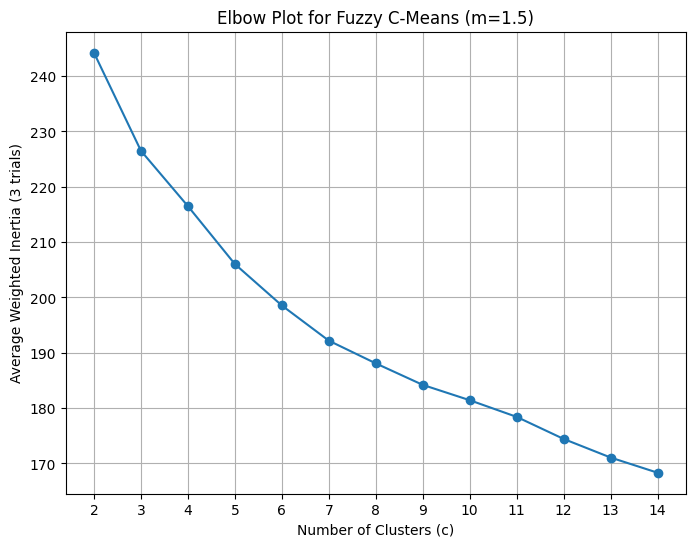

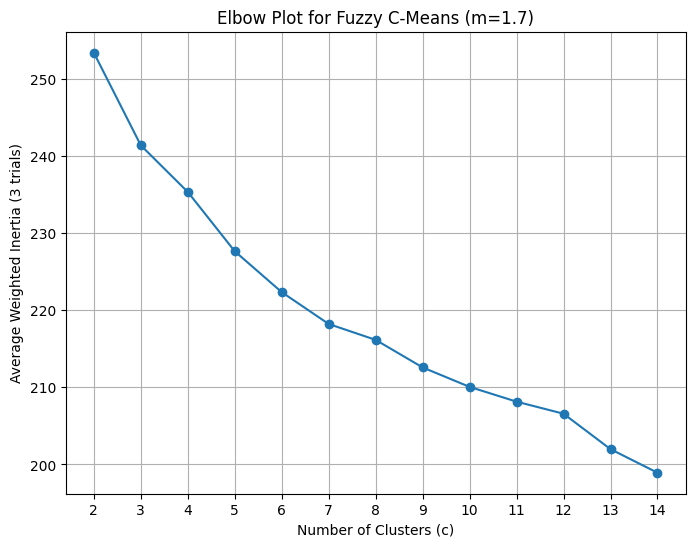

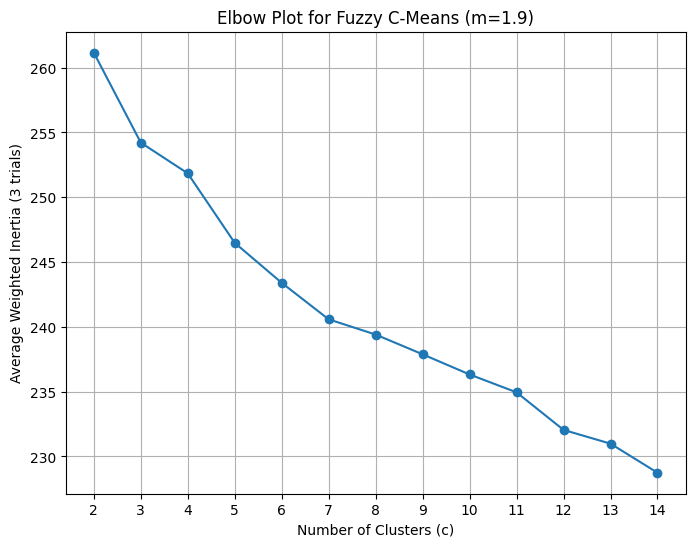

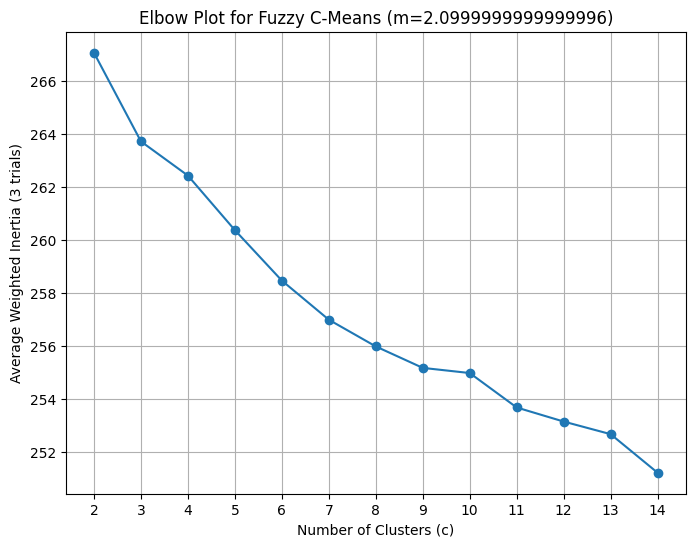

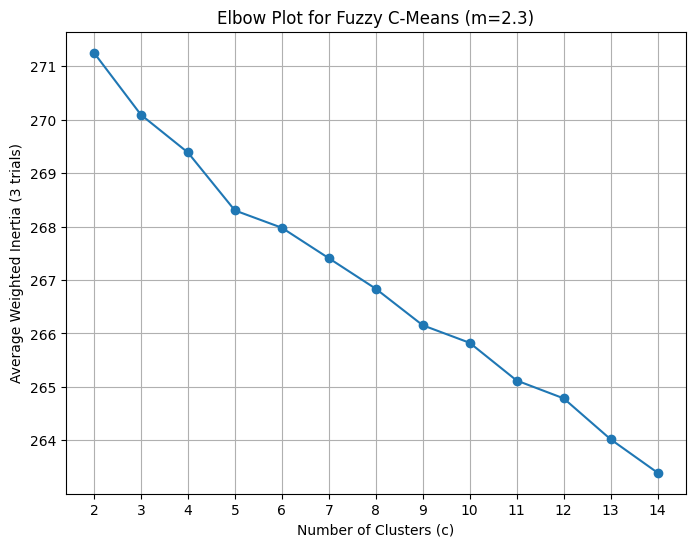

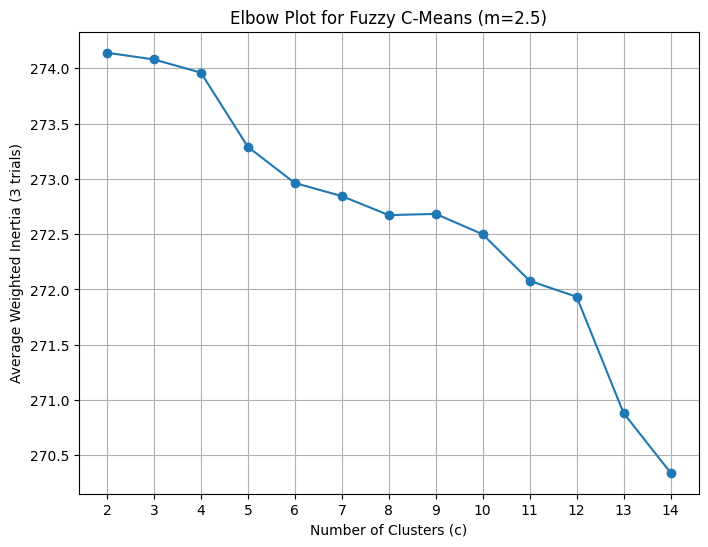

In [ ]:
m_values = np.arange(1.5, 2.6, 0.2)
cluster_range = range(2, 15)
for m in m_values:
    weighted_inertia_list = []

    for c in range(2, 15):
        sub_inertia_list = []

        for i in range(3):
            centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(
                X.T, c=c, m=m, error=1e-6, maxiter=20000, seed=100 + i
            )
            sub_inertia_list.append(np.sum(W * dist_mat))

        weighted_inertia_list.append(np.mean(sub_inertia_list))

    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, weighted_inertia_list, marker='o', linestyle='-')
    plt.xlabel('Number of Clusters (c)')
    plt.xticks(cluster_range)
    plt.ylabel('Average Weighted Inertia (3 trials)')
    plt.title(f'Elbow Plot for Fuzzy C-Means (m={m})')
    plt.grid(True)
    plt.show()

For both sets of years, we see that we get a good number of clusters at an elbow of 3 initially, and with a fuzziness parameter of either 1.9 or 2.1. Since the bend is more distinct and unique at 1.9, we will use this for both, as it is relatively similar for all fuzziness in the second set of years. Additionally the clustering of 3 aligns with our TSNE graph from earlier as well as the dendrograms for Ward and Complete linkage for our second algorithm.

In [ ]:
def show_silhouette_plots(X,cluster_labels):
    import matplotlib.cm as cm

    n_clusters=len(np.unique(cluster_labels))

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])

    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]


        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()
    return

For our 2006-2007 data, we do a cluster with 3 clusters and fuzziness parameter of 1.9

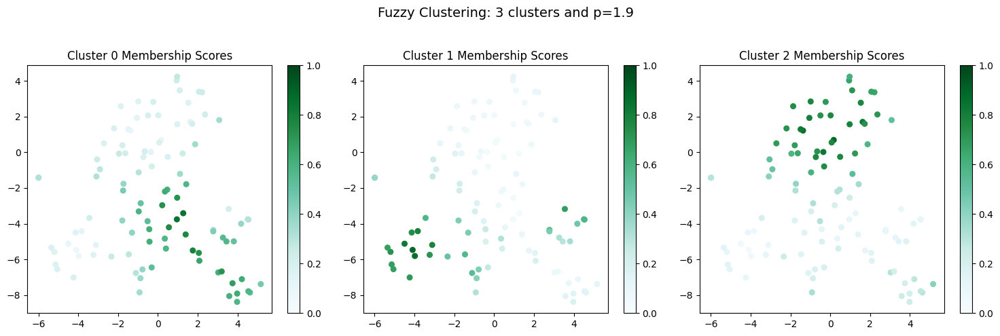

In [ ]:
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(df_scaled_no_label.T, c=3, m=1.9, error=1e-6, maxiter=20000, seed=100)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s' % (3, 1.9), fontsize=14)

for i in range(3):
    df_combo['Cluster %s Membership Score' % str(i)] = W[i, :]

    points = ax[i].scatter(
        df_combo["x_projected"], df_combo["y_projected"],
        c=df_combo['Cluster %s Membership Score' % str(i)],
        s=30, cmap="BuGn", vmin=0, vmax=1
    )

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title('Cluster %s Membership Scores' % str(i))

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
cluster_columns=['Cluster %s Membership Score'%(str(i)) for i in range(0,3)]
df_membership=pd.DataFrame(W.T, columns=cluster_columns)

cluster_assignments = df_membership.idxmax(axis=1)
fuzzy_label=df_scaled_no_label.copy()

cluster_assignments = cluster_assignments.str.extract('(\d+)').astype(int)
fuzzy_label['predicted_labels'] = cluster_assignments

## Clustering Results

The fuzzy clustering shows that there are three clusters with a few permanent observations but primarily a lot of observations that share membership with other cluster, as shown by the many observations with membership scores of 0.4 to 0.8

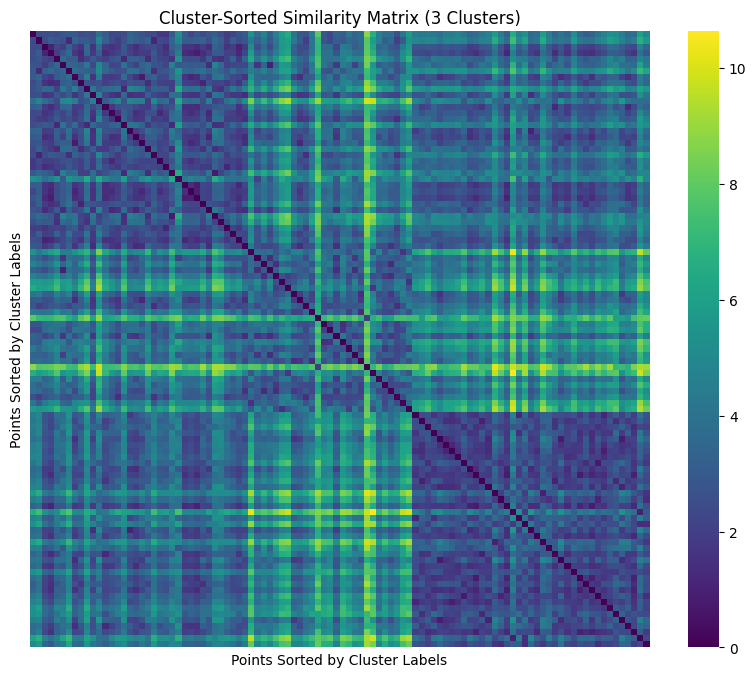

In [ ]:
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import AgglomerativeClustering

hac = AgglomerativeClustering(n_clusters=3, linkage='ward')
cluster_labels = fuzzy_label['predicted_labels']

distance_matrix = squareform(pdist(df_scaled_no_label, metric='euclidean'))
sorted_indices = np.argsort(cluster_labels)
sorted_distance_matrix = distance_matrix[sorted_indices, :][:, sorted_indices]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_distance_matrix, cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("Cluster-Sorted Similarity Matrix (3 Clusters)")
plt.xlabel("Points Sorted by Cluster Labels")
plt.ylabel("Points Sorted by Cluster Labels")
plt.show()

For n_clusters = 3 The average silhouette_score is : 0.2261290488655405


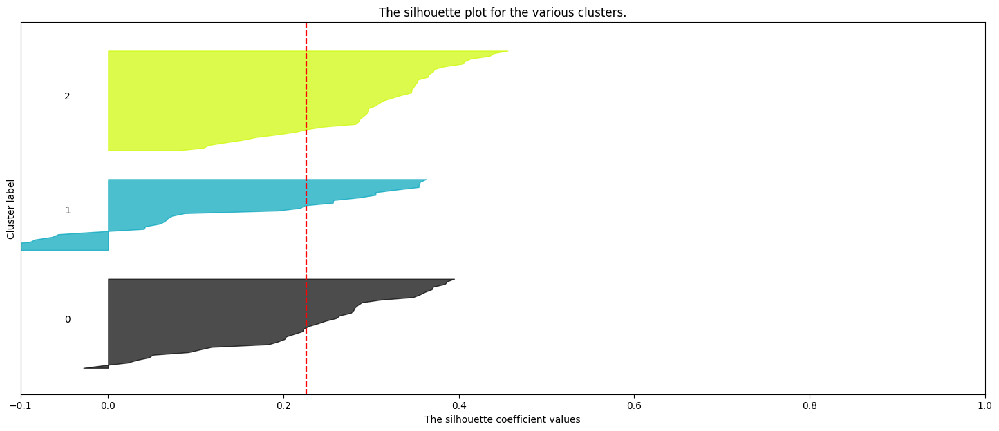

In [ ]:
show_silhouette_plots(df_scaled_no_label, fuzzy_label['predicted_labels'])

### Additional Analysis

The similarity matrix suggests three clusters with moderate or moderate-to-strong separation between clusters. There are some thin lines which indicate some points closer to boundaries. We also see from the matrix that the smaller cluster might be a bit sparse and less well separated than the other two clusters, which is supported by the silhouette plot. Since the silhouette values are mostly positive and the similarity matrix showed a good 3 distinct clusters, I think they're a good enough measure for this dataset.

## Finding Inherent Clusters

From this labeling, we do not believe that the clustering has split any inherent clusters as it matches with the overall splitting of the TSNE graph itself. Similarly there are only two large clusters and one smaller cluster so there is no reason to suggest one cluster has been assigned to include to inherent clusters.

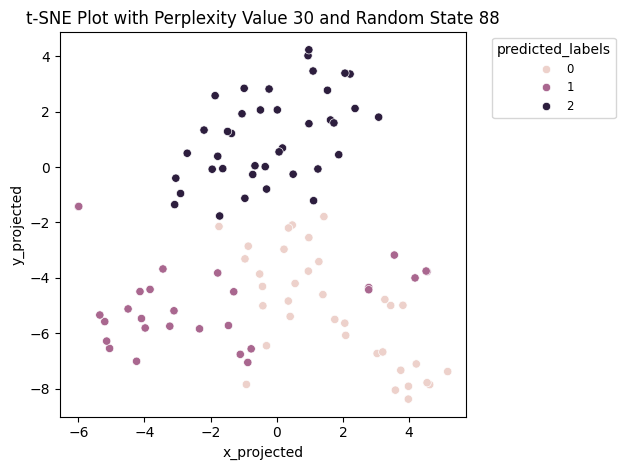

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=88)
data_tsne = tsne.fit_transform(df_scaled_no_label)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([fuzzy_label, df_tsne], axis=1)
sns.scatterplot(x='x_projected', y='y_projected', hue='predicted_labels', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (30, 88))

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='predicted_labels', fontsize='small')
plt.tight_layout()
plt.show()

### Qualitative Analysis

In [ ]:
filtered_df = df_rates_year[df_rates_year["Year"].isin([2006, 2007])]
filtered_df = filtered_df.reset_index(drop=True)

fuzzy_label['State'] = filtered_df['State'].values
fuzzy_label['Year'] = filtered_df['Year'].values
fuzzy_label

,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+,predicted_labels,State,Year
0,-0.652205,-1.886002,-1.274354,-0.330579,-1.007933,-0.319935,-0.968851,-1.559537,-0.882651,2,Alabama,2006
1,0.421925,-0.127831,-0.146083,0.050881,0.919278,0.537602,0.936613,0.715269,1.808811,1,Alaska,2006
2,-0.544290,-0.944037,-0.063655,3.169380,1.337955,0.953883,-0.356830,-0.515661,-0.654688,0,Arizona,2006
3,1.505892,0.340088,0.374333,0.163500,0.189882,-0.305326,-0.254176,-0.374601,-0.025930,0,Arkansas,2006
4,0.218097,-0.386039,0.731872,0.901951,0.108379,0.021886,-0.089543,-0.140544,0.423996,0,California,2006
...,...,...,...,...,...,...,...,...,...,...,...,...
97,-0.341151,0.356066,-0.130125,-0.378889,-0.387668,-0.191124,-0.017878,-0.218987,-0.333081,0,Virginia,2007
98,-0.052920,0.164891,0.409810,0.272040,0.190571,-0.052887,0.459151,0.318981,1.152458,1,Washington,2007
99,-0.825341,-0.613118,-1.485896,-0.286034,0.932644,0.222486,-0.266032,-0.770286,-0.587139,2,West Virginia,2007
100,1.034884,1.486837,0.763524,0.448026,0.707493,0.923094,0.214708,0.362040,-0.085621,1,Wisconsin,2007


<ipython-input-59-b3674bc094a8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-59-b3674bc094a8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-59-b3674bc094a8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-59-b3674bc094a8>:20: FutureWarning: 

Passing `palet

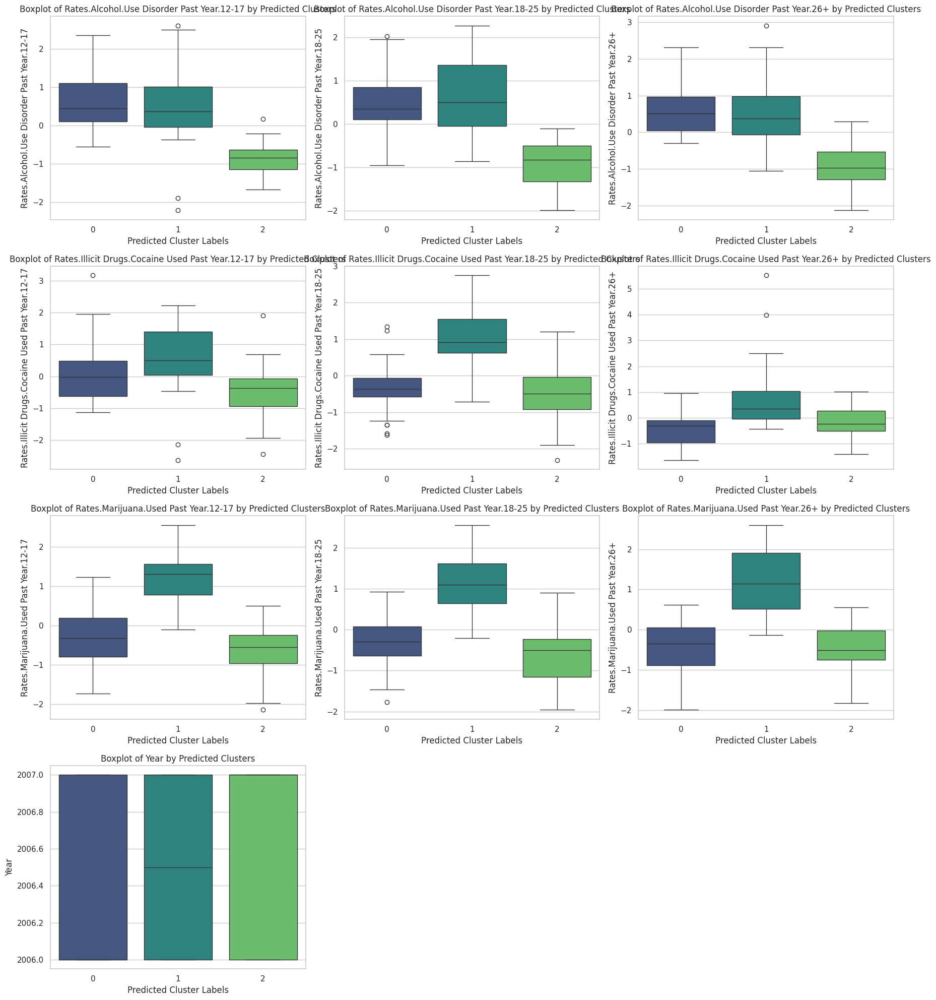

<ipython-input-59-b3674bc094a8>:41: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


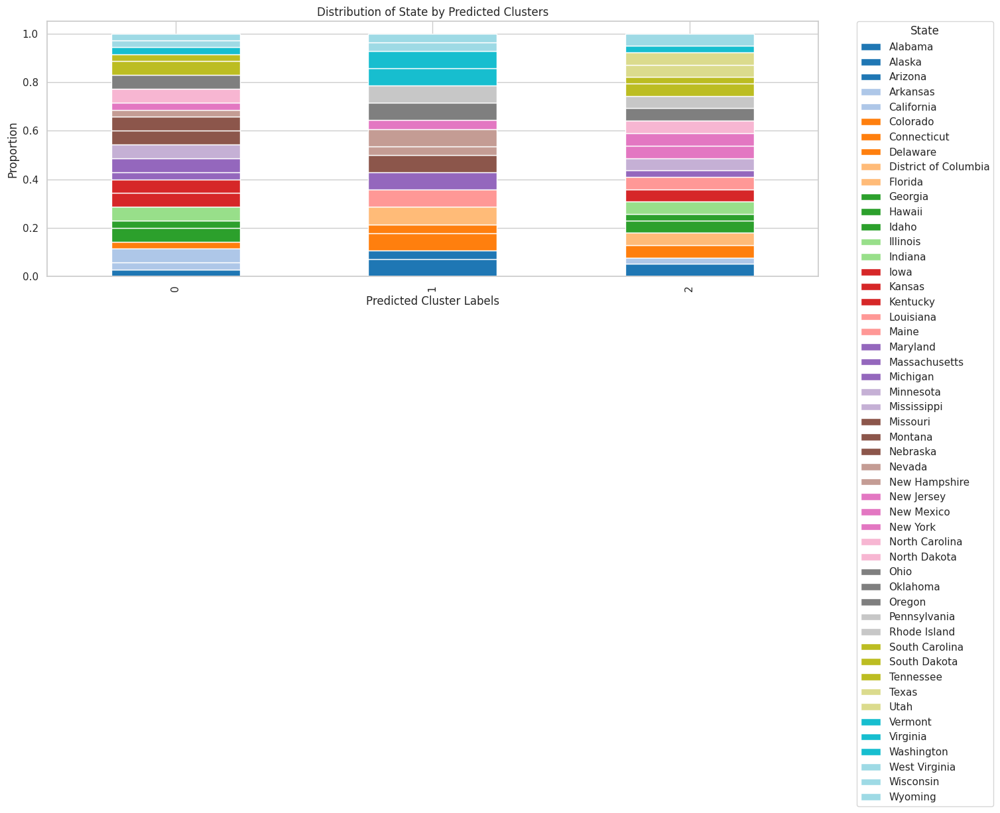

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

numerical_columns = fuzzy_label.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = fuzzy_label.select_dtypes(include=['object', 'category']).columns

numerical_columns = [col for col in numerical_columns if col != 'predicted_labels']

num_plots = len(numerical_columns)
cols = 3
rows = -(-num_plots // cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=fuzzy_label, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Boxplot of {col} by Predicted Clusters')
    axes[i].set_xlabel('Predicted Cluster Labels')
    axes[i].set_ylabel(col)

for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5 * len(categorical_columns)))
for i, col in enumerate(categorical_columns):
    plt.subplot(len(categorical_columns), 1, i + 1)
    cluster_categorical = pd.crosstab(fuzzy_label['predicted_labels'], fuzzy_label[col], normalize='index')
    cluster_categorical.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(f'Distribution of {col} by Predicted Clusters')
    plt.xlabel('Predicted Cluster Labels')
    plt.ylabel('Proportion')
    plt.legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.tight_layout()
plt.show()


For our 2008-2009 data, we do a cluster with 3 clusters and fuzziness parameter of 1.9

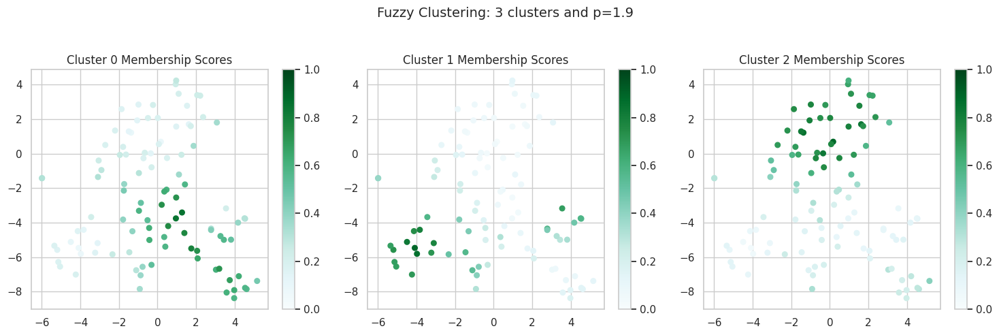

In [ ]:
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(df_scaled_no_label2.T, c=3, m=1.9, error=1e-6, maxiter=20000, seed=100)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s' % (3, 1.9), fontsize=14)

for i in range(3):
    df_combo['Cluster %s Membership Score' % str(i)] = W[i, :]

    points = ax[i].scatter(
        df_combo["x_projected"], df_combo["y_projected"],
        c=df_combo['Cluster %s Membership Score' % str(i)],
        s=30, cmap="BuGn", vmin=0, vmax=1
    )

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title('Cluster %s Membership Scores' % str(i))

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Cluster Algorithm Results

The fuzzy clustering shows that there are three clusters with a few permanent observations but primarily a lot of observations that share membership with other cluster, as shown by the many observations with membership scores. We do see slightly more observations that are closer to 0.8 especially for those in Cluster 0 compared to the ones for 2006-2007.

In [ ]:
cluster_columns=['Cluster %s Membership Score'%(str(i)) for i in range(0,3)]
df_membership=pd.DataFrame(W.T, columns=cluster_columns)

cluster_assignments = df_membership.idxmax(axis=1)
fuzzy_label2=df_scaled_no_label2.copy()

cluster_assignments = cluster_assignments.str.extract('(\d+)').astype(int)

fuzzy_label2['predicted_labels'] = cluster_assignments

### Additional Analysis:

The similarity matrix suggests three clusters with moderate or worse separation between clusters. There are a lot more bright and thin lines in the similarity matrix which indicate some points closer to boundaries. We also see from the matrix that the smaller cluster might be a bit sparse and less well separated than the other two clusters, however the other two are relatively sparse as well which is supported by the silhouette plot. We do see that all three silhouette graphs have negative values of roughly equal amount so maybe other methods could be better to further differentiate apart from just similarity matrix and silhouette scores.


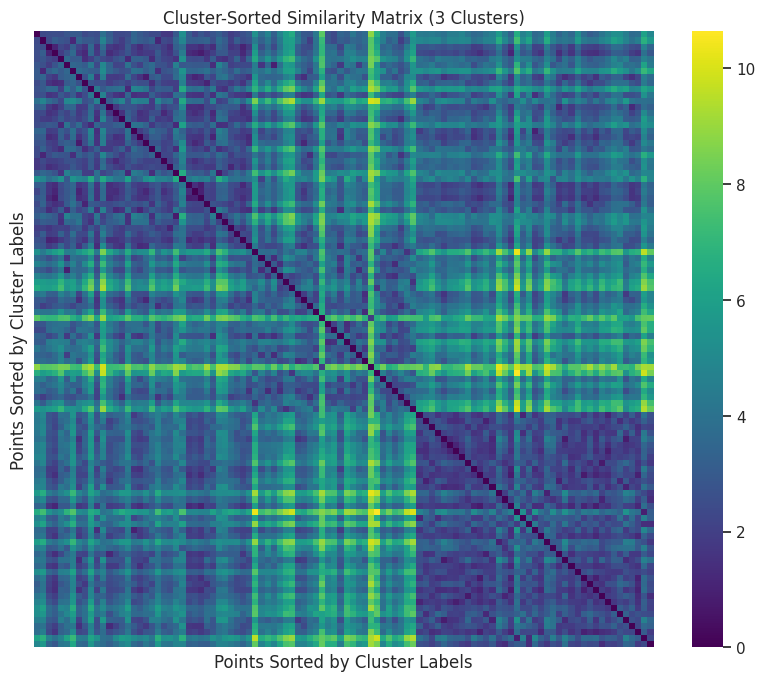

In [ ]:
from scipy.spatial.distance import pdist, squareform

from sklearn.cluster import AgglomerativeClustering
hac = AgglomerativeClustering(n_clusters=3, linkage='ward')
cluster_labels = fuzzy_label2['predicted_labels']

distance_matrix = squareform(pdist(df_scaled_no_label2, metric='euclidean'))
sorted_indices = np.argsort(cluster_labels)
sorted_distance_matrix = distance_matrix[sorted_indices, :][:, sorted_indices]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_distance_matrix, cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("Cluster-Sorted Similarity Matrix (3 Clusters)")
plt.xlabel("Points Sorted by Cluster Labels")
plt.ylabel("Points Sorted by Cluster Labels")
plt.show()

In [ ]:
show_silhouette_plots(df_scaled_no_label2, fuzzy_label2['predicted_labels'])

NameError: name 'show_silhouette_plots' is not defined

### Inherent Clusters

From the TSNE graph it is slightly apparent that cluster 0 and 2 have split a large inherent cluster in the dataset, however like before no cluster has taken up two inherent clusters.

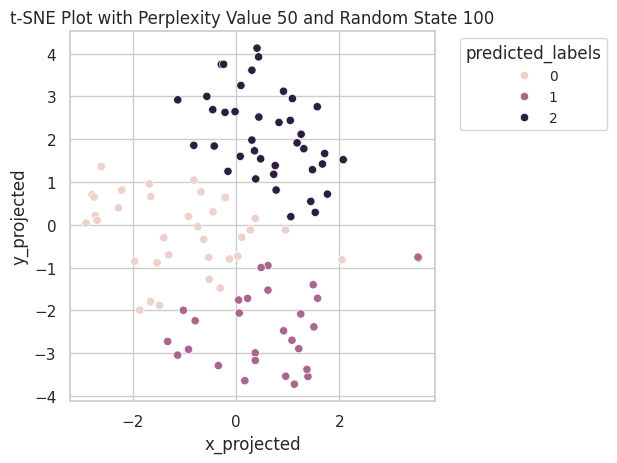

In [ ]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(df_scaled_no_label2)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([fuzzy_label, df_tsne], axis=1)
sns.scatterplot(x='x_projected', y='y_projected', hue='predicted_labels', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (perp, rs))

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='predicted_labels', fontsize='small')
plt.tight_layout()
plt.show()

### Qualitative Analysis

In [ ]:
fuzzy_label2['State'] = filtered_df['State'].values
fuzzy_label2['Year'] = filtered_df['Year'].values
fuzzy_label2

,Rates.Alcohol.Use Disorder Past Year.12-17,Rates.Alcohol.Use Disorder Past Year.18-25,Rates.Alcohol.Use Disorder Past Year.26+,Rates.Illicit Drugs.Cocaine Used Past Year.12-17,Rates.Illicit Drugs.Cocaine Used Past Year.18-25,Rates.Illicit Drugs.Cocaine Used Past Year.26+,Rates.Marijuana.Used Past Year.12-17,Rates.Marijuana.Used Past Year.18-25,Rates.Marijuana.Used Past Year.26+,predicted_labels,State,Year
0,-0.652205,-1.886002,-1.274354,-0.330579,-1.007933,-0.319935,-0.968851,-1.559537,-0.882651,2,Alabama,2006
1,0.421925,-0.127831,-0.146083,0.050881,0.919278,0.537602,0.936613,0.715269,1.808811,1,Alaska,2006
2,-0.544290,-0.944037,-0.063655,3.169380,1.337955,0.953883,-0.356830,-0.515661,-0.654688,0,Arizona,2006
3,1.505892,0.340088,0.374333,0.163500,0.189882,-0.305326,-0.254176,-0.374601,-0.025930,0,Arkansas,2006
4,0.218097,-0.386039,0.731872,0.901951,0.108379,0.021886,-0.089543,-0.140544,0.423996,0,California,2006
...,...,...,...,...,...,...,...,...,...,...,...,...
97,-0.341151,0.356066,-0.130125,-0.378889,-0.387668,-0.191124,-0.017878,-0.218987,-0.333081,0,Virginia,2007
98,-0.052920,0.164891,0.409810,0.272040,0.190571,-0.052887,0.459151,0.318981,1.152458,1,Washington,2007
99,-0.825341,-0.613118,-1.485896,-0.286034,0.932644,0.222486,-0.266032,-0.770286,-0.587139,2,West Virginia,2007
100,1.034884,1.486837,0.763524,0.448026,0.707493,0.923094,0.214708,0.362040,-0.085621,1,Wisconsin,2007


<ipython-input-66-e0eae346e31a>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label2, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-66-e0eae346e31a>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label2, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-66-e0eae346e31a>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=fuzzy_label2, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
<ipython-input-66-e0eae346e31a>:20: FutureWarning: 

Passing `pa

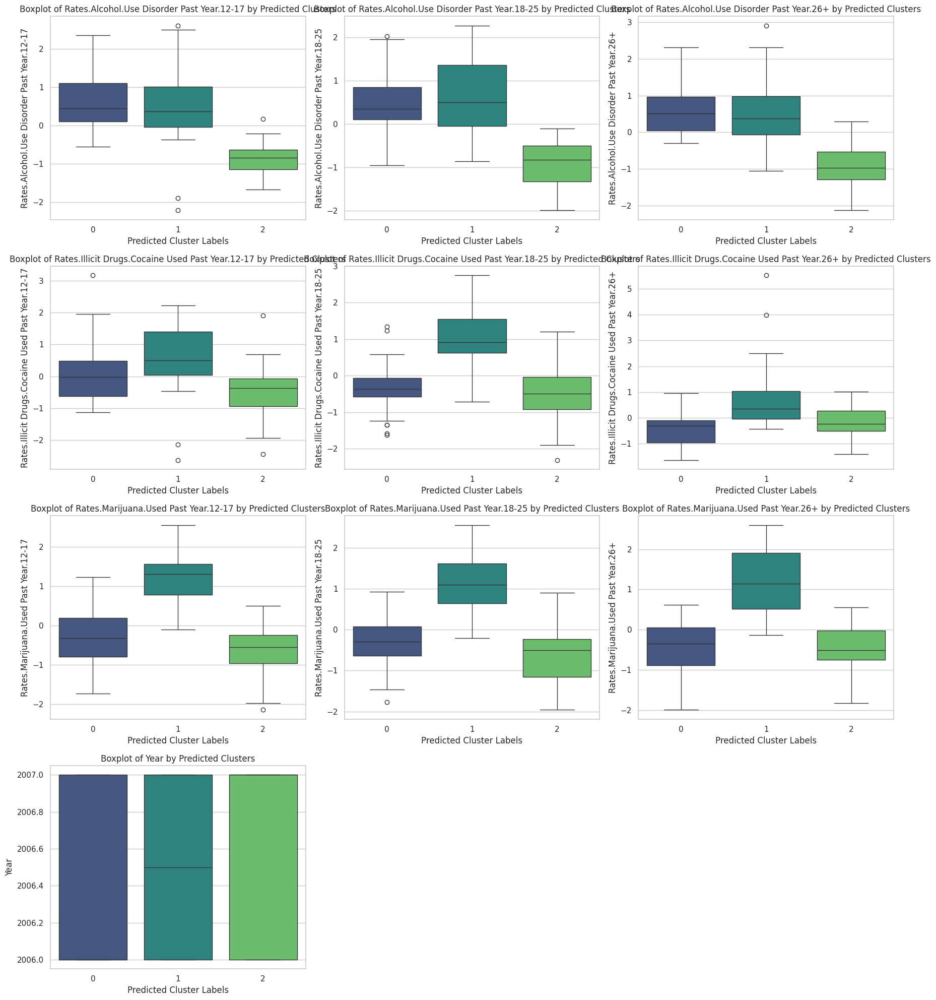

<ipython-input-66-e0eae346e31a>:41: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


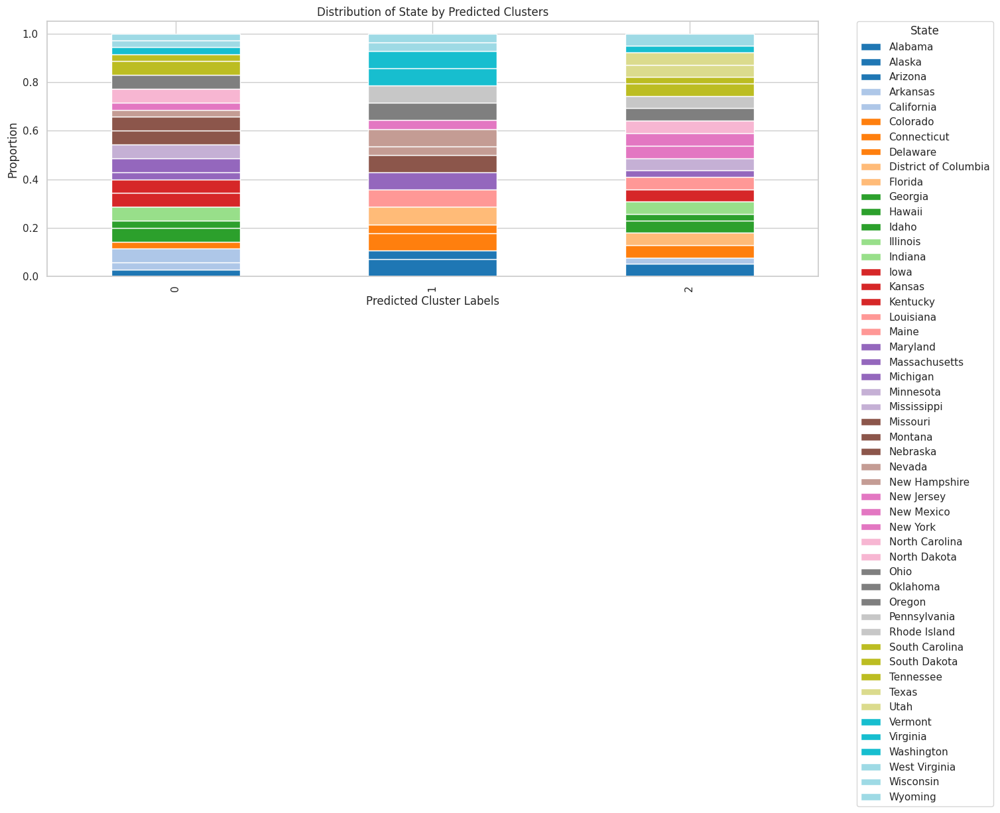

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

numerical_columns = fuzzy_label2.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = fuzzy_label2.select_dtypes(include=['object', 'category']).columns

numerical_columns = [col for col in numerical_columns if col != 'predicted_labels']

num_plots = len(numerical_columns)
cols = 3
rows = -(-num_plots // cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=fuzzy_label2, x='predicted_labels', y=col, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Boxplot of {col} by Predicted Clusters')
    axes[i].set_xlabel('Predicted Cluster Labels')
    axes[i].set_ylabel(col)

for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5 * len(categorical_columns)))
for i, col in enumerate(categorical_columns):
    plt.subplot(len(categorical_columns), 1, i + 1)
    cluster_categorical = pd.crosstab(fuzzy_label2['predicted_labels'], fuzzy_label2[col], normalize='index')
    cluster_categorical.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(f'Distribution of {col} by Predicted Clusters')
    plt.xlabel('Predicted Cluster Labels')
    plt.ylabel('Proportion')
    plt.legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.tight_layout()
plt.show()


### Qualitative Analysis Overall

Across the 2006-2007 and 2008-2009 periods, the clustering results for drug abuse patterns and state-level distributions reveal overall consistent trends.

Three distinct clusters emerge:

Cluster 0: This group shows moderate rates of alcohol, cocaine, and marijuana use across all age groups. The states in this cluster are geographically diverse, spanning across both the Midwest and Southern U.S. These states appear to have relatively stable patterns of substance abuse with no extreme outliers. We could say that this serves as a baseline but that isn't really helpful considering our research goal of just learning about each cluster.

Cluster 1: States in this smaller cluster display higher rates of substance abuse, particularly in younger age groups (12-17 and 18-25 years). Notably, marijuana and cocaine use are more prominent in this cluster. Geographically, these states tend to be more concentrated in urban and coastal areas, such as California and the Northeast.

Cluster 2: This cluster demonstrates lower rates of substance abuse across all age groups. Alcohol and marijuana use are notably below average, and the states in this cluster are more concentrated in the Midwestern and rural Southern regions. These states exhibit a lower overall risk for substance use disorders.

There aren't many difference between these three clusters across the two year pairs. There is a slight increase in drug abuse rates is observed in Cluster 1 for younger age groups (12-25 years) in 2008-2009.

## 9. Clustering Algorithm #2: HAC- Complete



Parameter Selection:
- n_clusters
1. method 1: t-SNE plot
  - The t-SNE plot suggests 2 or 3 clusters.
  - Visually, we observe either:
    - Two clusters, or
    - Two larger clusters and one smaller cluster depending on perspective.
- Overall, the t-SNE plot leans towards suggesting 2 clusters.
- However, t-SNE does not provide information about the distances between clusters, making it uncertain whether the smaller cluster is truly separated from the others.

2. method 2: Dendrogram (Ward's Linkage)
  - The dendrogram clearly suggests 3 clusters.
  - This is based on the large dissimilarity between the smaller cluster and the two larger clusters.
  - Unlike t-SNE, the dendrogram shows that the smaller cluster is much further away from the other two clusters, confirming its distinct separation.

  Based on the strong suggestion from the dendogram, we choose to cluster dataset by 3 clusters.

HAC-ward's for year 2006-2007

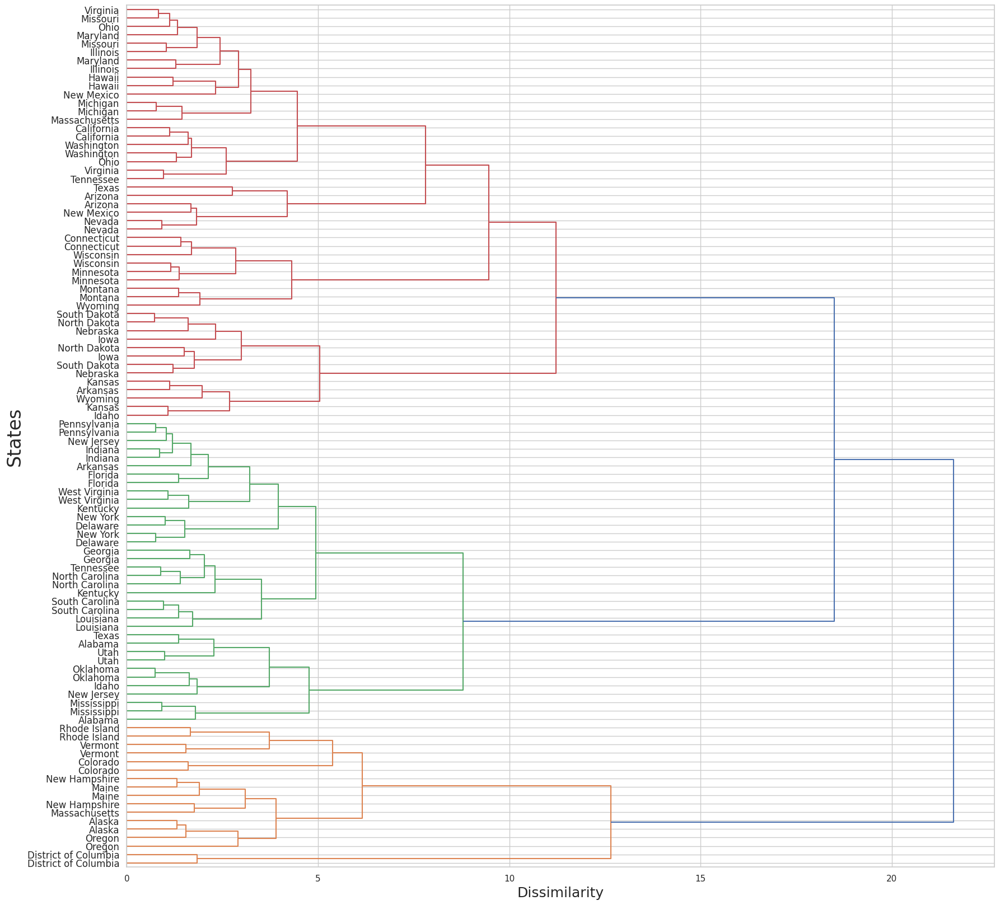

In [ ]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

dm = pdist(df_scaled_no_label, metric='euclidean')
Z = linkage(dm, method='ward')

fig, ax = plt.subplots(figsize=(20, 20))
d = dendrogram(Z, orientation='right', labels=df_scaled_label['State'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('States', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

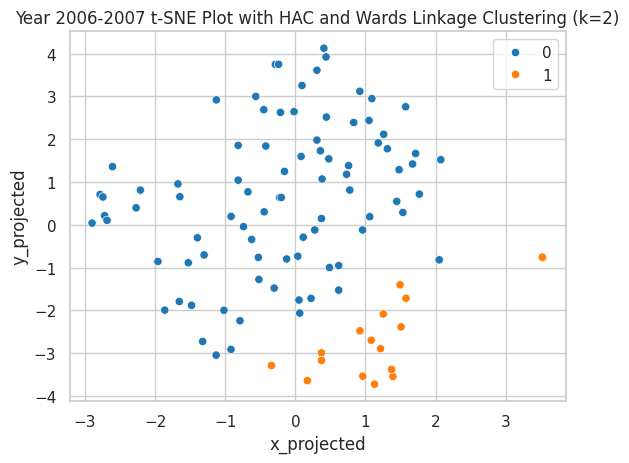

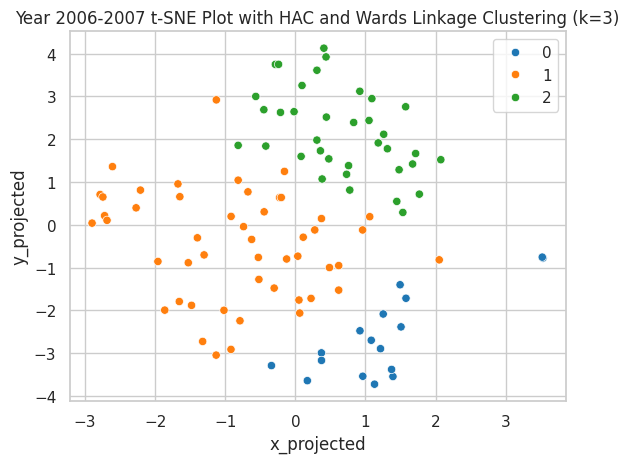

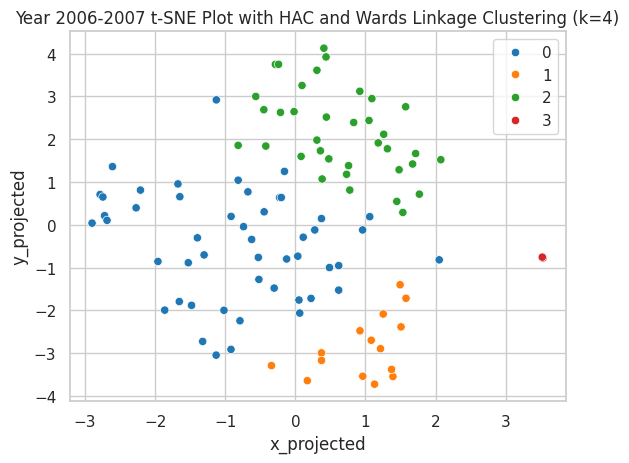

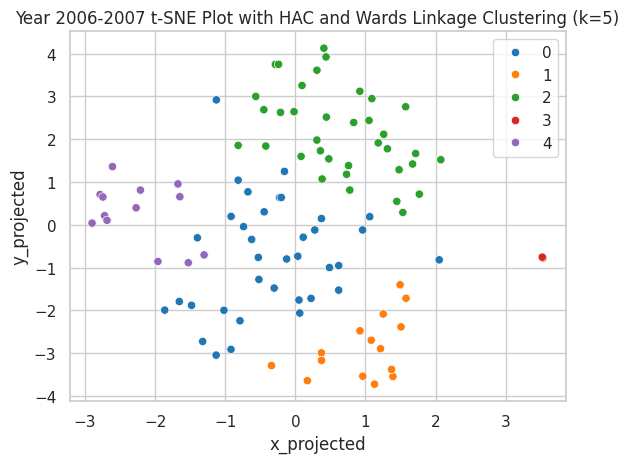

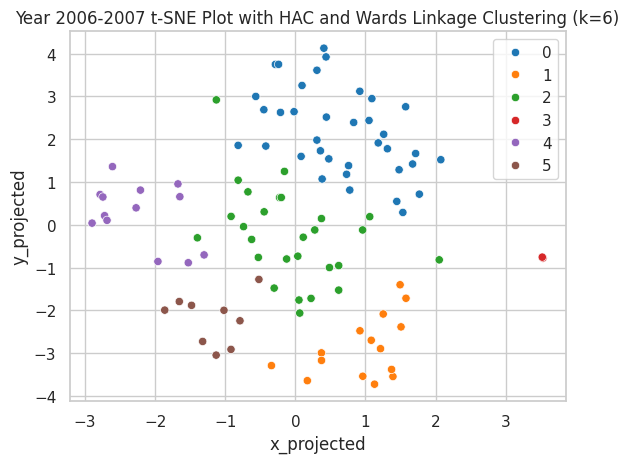

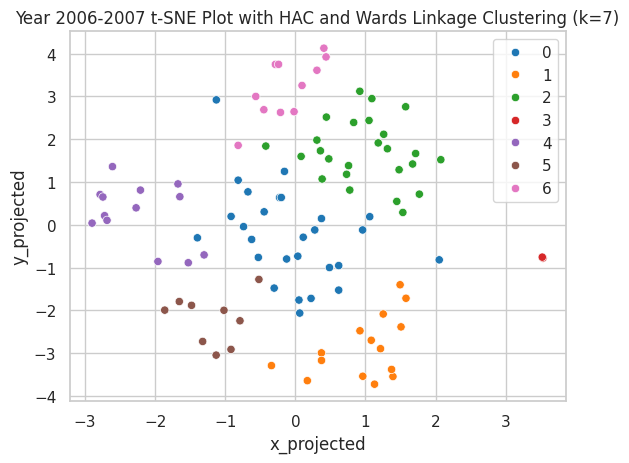

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import seaborn as sns
import matplotlib.pyplot as plt

for k in range(2, 8):
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
    df_combo['predicted_cluster'] = hac.fit_predict(df_scaled_no_label)

    sns.scatterplot(x='x_projected', y='y_projected', hue='predicted_cluster', palette='tab10', data=df_combo)
    plt.title('Year 2006-2007 t-SNE Plot with HAC and Wards Linkage Clustering (k=%d)' % k)
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()


HAC-ward's for year 2008-2009

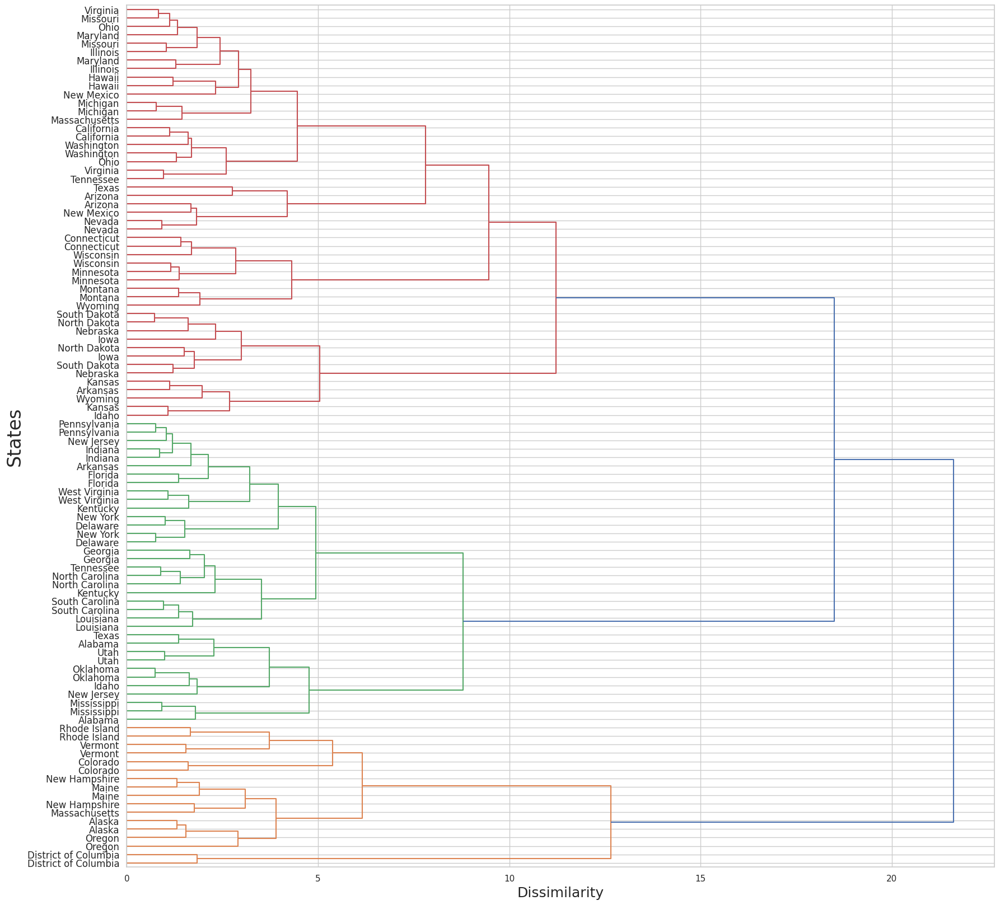

In [ ]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

dm = pdist(df_scaled_no_label2, metric='euclidean')
Z = linkage(dm, method='ward')

fig, ax = plt.subplots(figsize=(20, 20))
d = dendrogram(Z, orientation='right', labels=df_scaled_label2['State'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('States', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

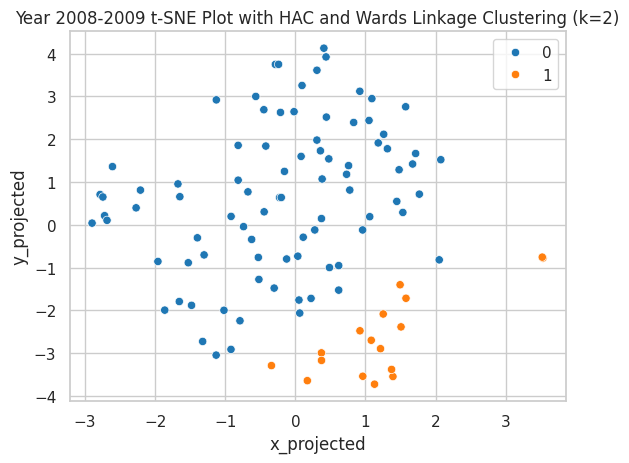

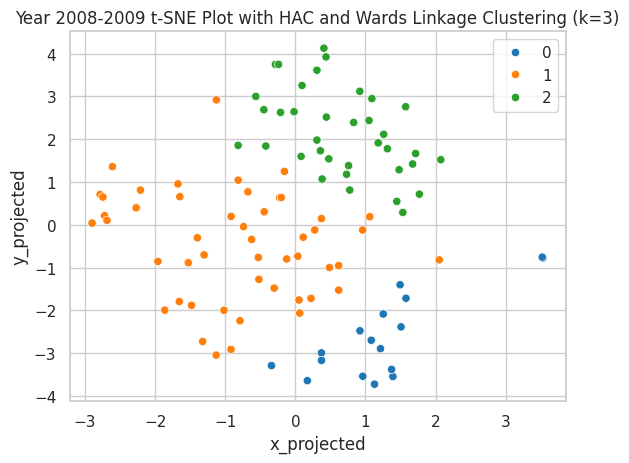

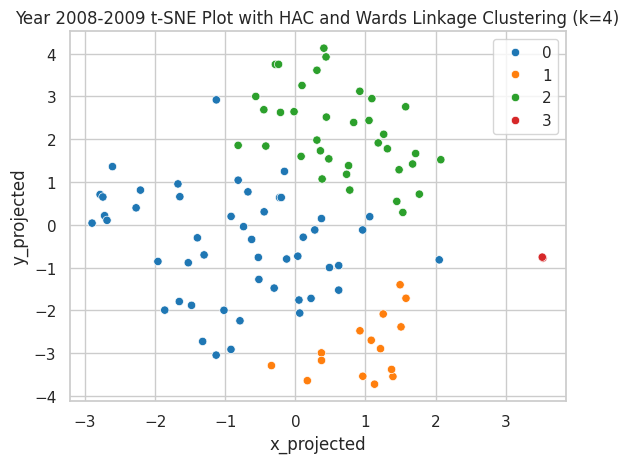

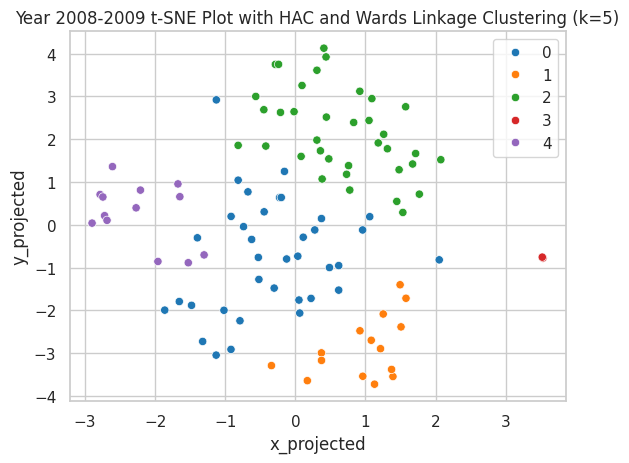

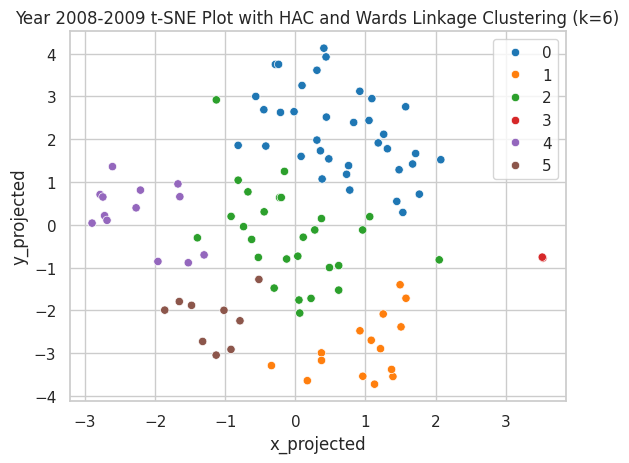

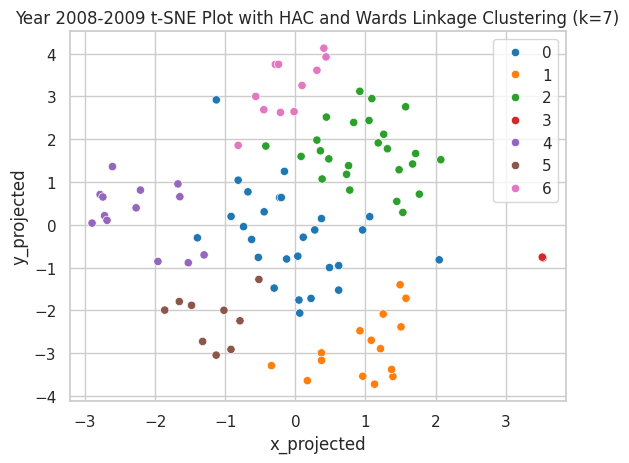

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import seaborn as sns
import matplotlib.pyplot as plt

for k in range(2, 8):
    hac = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
    df_combo['predicted_cluster'] = hac.fit_predict(df_scaled_no_label)

    sns.scatterplot(x='x_projected', y='y_projected', hue='predicted_cluster', palette='tab10', data=df_combo)
    plt.title('Year 2008-2009 t-SNE Plot with HAC and Wards Linkage Clustering (k=%d)' % k)
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()

Clustering Algorithm Outcomes:

- The identified groups of states with similar drug heuristics will be useful in not only targeting but also crafting more localized approaches increasing the impact of set programs as there are limited resources.
We notice that states that are closer together geographically are in the same larger cluster that emerge around the more general top parts of the dendrogram, while more specific clusters can be found near the spine of it. If the audience wanted to focus on the shift of the between two vastle different economical situations, it would be beneficial to help predict areas that are likely to need help in the future.
- These nested relationships do provide some instruction regarding how to target aid better in that Smaller, lower-level clusters represent specific regional trends and thereby high intervention need areas. Then Higher-level clusters allows to observe overall patterns at the country level which constitutes the base for the design of broader strategies.






Additional Cluster Exploration:
- The cluster-sorted similarity matrix demonstrates strong separation of only a single cluster, as evidenced by the lighter off-diagonal regions indicating high dissimilarity. However, two of the clusters appears closer to the eachother, suggesting potential overlap in the feature space.

- The matrix also reveals differences in intra-cluster cohesion. Some clusters show lighter diagonal blocks, indicating higher intra-cluster distances and greater diffusion within those clusters. This contrasts with other clusters, which appear denser and more integrated, as seen by their darker diagonal blocks.

- While both the silhouette plot and the similarity matrix provide valuable insights into cluster cohesion and separation, they come with certain limitations. The silhouette plot assumes that clusters are convex, which may not hold true for clusters with irregular shapes. Similarly, the similarity matrix can lose interpretability with larger datasets, as the visualization becomes increasingly complex and less meaningful. However, given that the dataset in question is relatively small and the clusters in our t-SNE plot did not appear irregular, these methods were appropriate for evaluating the dataset.

In [ ]:
def show_silhouette_plots(X,cluster_labels):
    import matplotlib.cm as cm
    n_clusters=len(np.unique(cluster_labels))

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]


        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.show()

    return

year 2006-2007

In [ ]:
hac_label= df_scaled_label.copy()
hac = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
hac_label['predicted_cluster'] = hac.fit_predict(df_scaled_no_label)

For n_clusters = 3 The average silhouette_score is : 0.24097156401504846


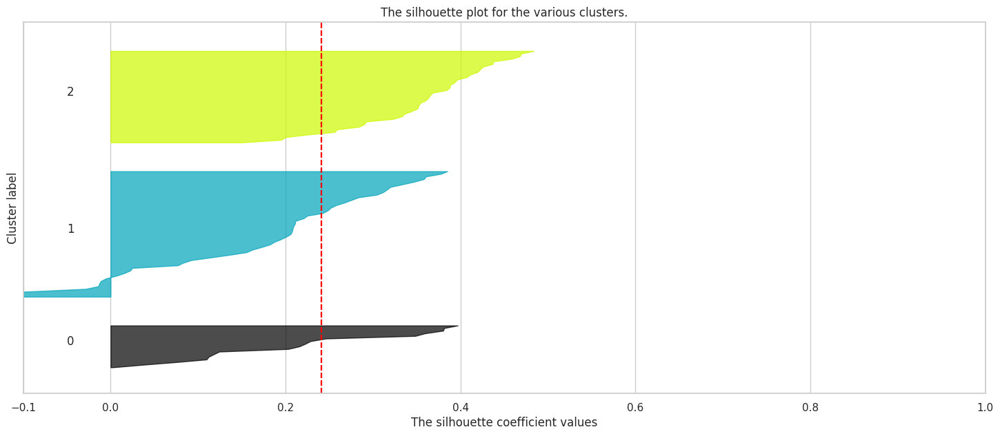

In [ ]:
show_silhouette_plots(df_scaled_no_label, hac.fit_predict(df_scaled_no_label))

year 2008-2009

In [ ]:
hac_label2= df_scaled_label2.copy()
hac2 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
hac_label2['predicted_cluster'] = hac2.fit_predict(df_scaled_no_label2)

For n_clusters = 3 The average silhouette_score is : 0.24097156401504846


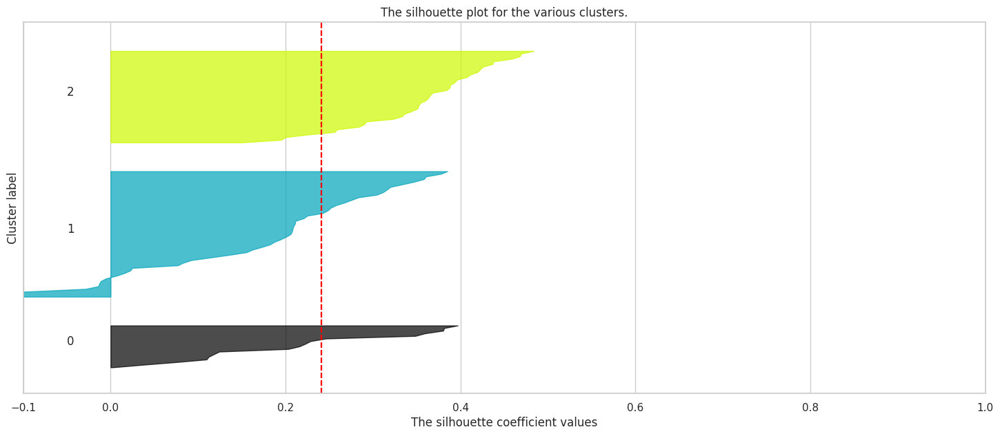

In [ ]:
show_silhouette_plots(df_scaled_no_label2, hac.fit_predict(df_scaled_no_label2))

Finding the "Inherent" Clusters
- The dataset presented appears to contain clusters that are consistent with the expected patterns. There does not seem to be any clusters that have been split in any of the clustering algorithms. Although there are also negative values in the silhouette plot, this was also expected as in the tnse we can notice that not clsuters are not perfectly well seperated. This is also apparent in the low avergae silhouette scores. I think that the clusters are not the cleanest, it is accurate of our inherent clusters and have identified them effectively.

Are the two datasets identical?
True
Sum of absolute differences between datasets:
Rates.Alcohol.Use Disorder Past Year.12-17          0.0
Rates.Alcohol.Use Disorder Past Year.18-25          0.0
Rates.Alcohol.Use Disorder Past Year.26+            0.0
Rates.Illicit Drugs.Cocaine Used Past Year.12-17    0.0
Rates.Illicit Drugs.Cocaine Used Past Year.18-25    0.0
Rates.Illicit Drugs.Cocaine Used Past Year.26+      0.0
Rates.Marijuana.Used Past Year.12-17                0.0
Rates.Marijuana.Used Past Year.18-25                0.0
Rates.Marijuana.Used Past Year.26+                  0.0
dtype: float64
Summary statistics for df_scaled_no_label:
       Rates.Alcohol.Use Disorder Past Year.12-17  \
count                                1.020000e+02   
mean                                 2.525213e-16   
std                                  1.004938e+00   
min                                 -2.214853e+00   
25%                                 -7.329689e-01   
50%                                 -

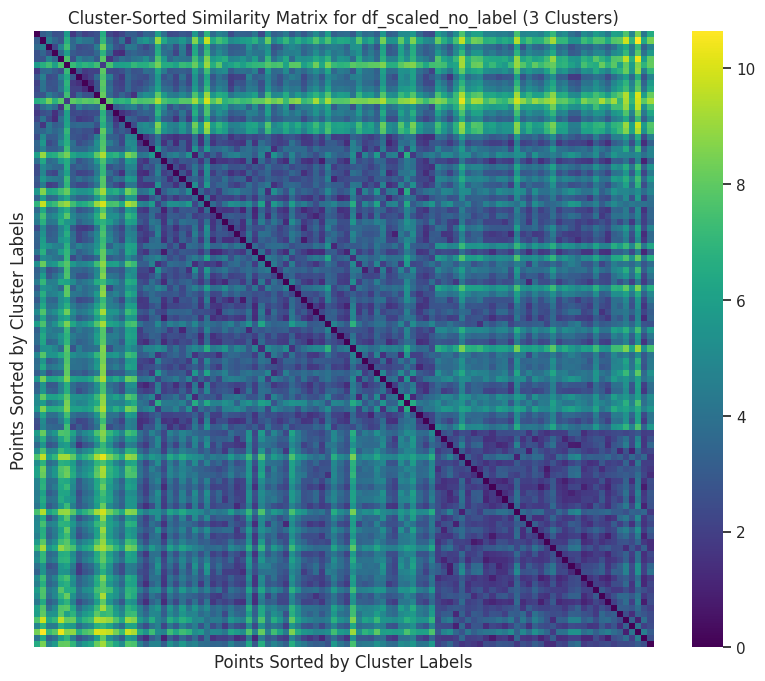

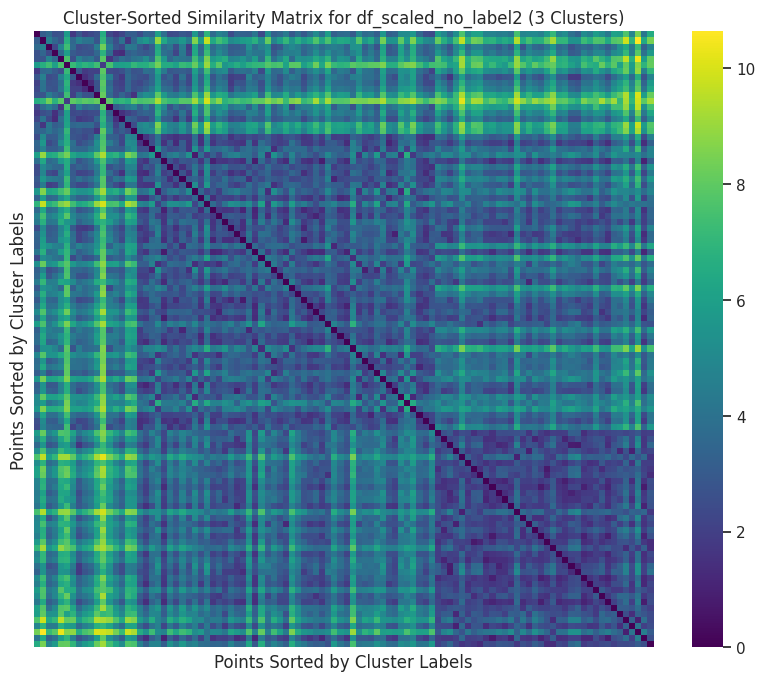

In [ ]:
from scipy.spatial.distance import pdist, squareform
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import numpy as np

# Compare df_scaled_no_label and df_scaled_no_label2
print("Are the two datasets identical?")
print(df_scaled_no_label.equals(df_scaled_no_label2))

# Check for differences in the datasets
print("Sum of absolute differences between datasets:")
diff = (df_scaled_no_label - df_scaled_no_label2).abs().sum()
print(diff)

# Print basic statistics for both datasets
print("Summary statistics for df_scaled_no_label:")
print(df_scaled_no_label.describe())
print("\nSummary statistics for df_scaled_no_label2:")
print(df_scaled_no_label2.describe())

# Perform Agglomerative Clustering on df_scaled_no_label
n_clusters = 3
hac = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
cluster_labels_1 = hac.fit_predict(df_scaled_no_label)

distance_matrix_1 = squareform(pdist(df_scaled_no_label, metric='euclidean'))
sorted_indices_1 = np.argsort(cluster_labels_1)
sorted_distance_matrix_1 = distance_matrix_1[sorted_indices_1, :][:, sorted_indices_1]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_distance_matrix_1, cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("Cluster-Sorted Similarity Matrix for df_scaled_no_label (3 Clusters)")
plt.xlabel("Points Sorted by Cluster Labels")
plt.ylabel("Points Sorted by Cluster Labels")
plt.show()

# Perform Agglomerative Clustering on df_scaled_no_label2
hac = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
cluster_labels_2 = hac.fit_predict(df_scaled_no_label2)

distance_matrix_2 = squareform(pdist(df_scaled_no_label2, metric='euclidean'))
sorted_indices_2 = np.argsort(cluster_labels_2)
sorted_distance_matrix_2 = distance_matrix_2[sorted_indices_2, :][:, sorted_indices_2]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_distance_matrix_2, cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("Cluster-Sorted Similarity Matrix for df_scaled_no_label2 (3 Clusters)")
plt.xlabel("Points Sorted by Cluster Labels")
plt.ylabel("Points Sorted by Cluster Labels")
plt.show()


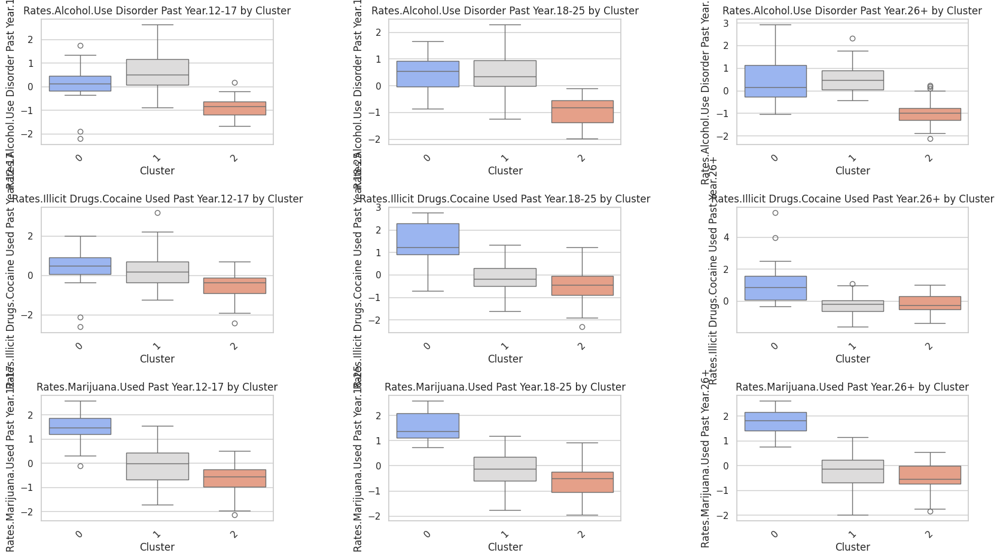

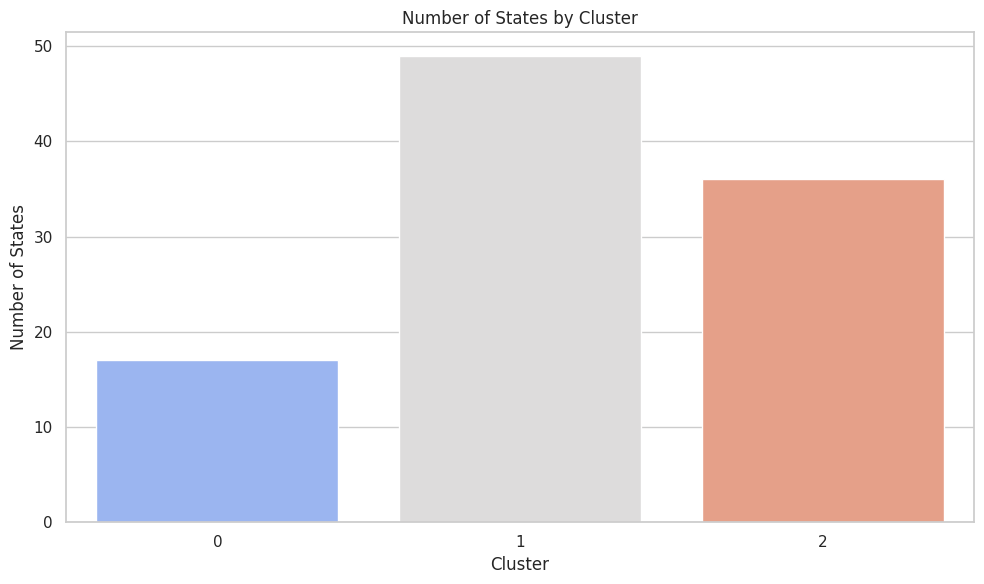

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Ensure the State column is treated as a string
df_scaled_label['State'] = df_scaled_label['State'].astype(str)

# Standardize features (exclude 'State' column for clustering)
scaler = StandardScaler()
features_scaled = scaler.fit_transform(df_scaled_label.drop(columns=['State']))

# Perform clustering
n_clusters = 3
hac = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
cluster_labels = hac.fit_predict(features_scaled)

# Add cluster labels to the dataframe
df_scaled_label['Cluster'] = cluster_labels

# Boxplots for numerical attributes
numerical_columns = df_scaled_label.select_dtypes(include=['float64', 'int64']).columns.drop('Cluster')

plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns):
    plt.subplot((len(numerical_columns) // 3) + 1, 3, i + 1)
    sns.boxplot(x='Cluster', y=col, data=df_scaled_label, palette='coolwarm')
    plt.title(f'{col} by Cluster')
    plt.xticks(rotation=45)
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

# Countplot for State column to show number of states in each cluster
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=df_scaled_label, palette='coolwarm')
plt.title('Number of States by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of States')
plt.tight_layout()
plt.show()


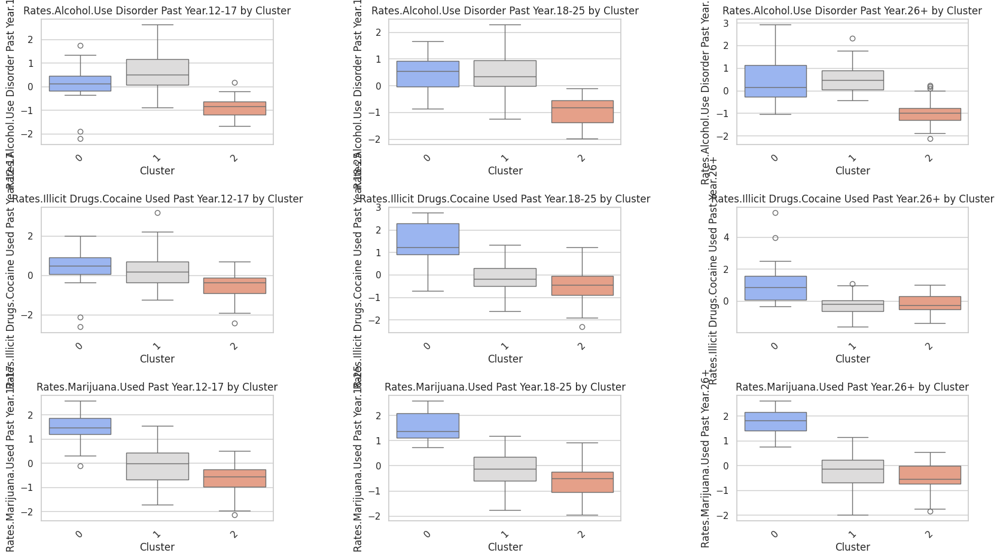

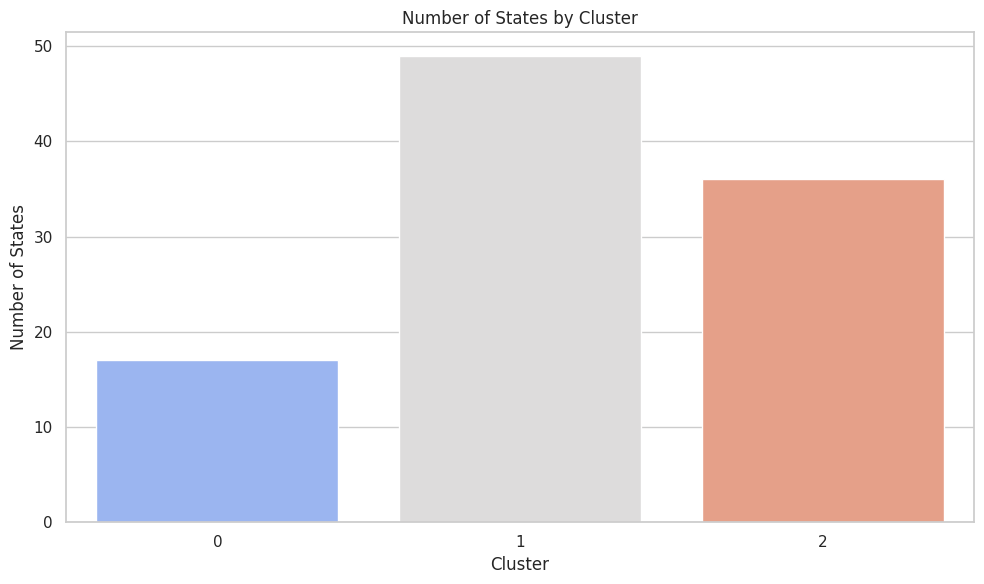

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

df_scaled_label2['State'] = df_scaled_label2['State'].astype(str)

scaler = StandardScaler()
features_scaled = scaler.fit_transform(df_scaled_label2.drop(columns=['State']))

n_clusters = 3
hac = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
cluster_labels = hac.fit_predict(features_scaled)

df_scaled_label2['Cluster'] = cluster_labels

numerical_columns = df_scaled_label2.select_dtypes(include=['float64', 'int64']).columns.drop('Cluster')

plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns):
    plt.subplot((len(numerical_columns) // 3) + 1, 3, i + 1)
    sns.boxplot(x='Cluster', y=col, data=df_scaled_label2, palette='coolwarm')
    plt.title(f'{col} by Cluster')
    plt.xticks(rotation=45)
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=df_scaled_label2, palette='coolwarm')
plt.title('Number of States by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of States')
plt.tight_layout()
plt.show()


Overall Trends:

- Cluster 0 consistently has a higher median across nearly all age groups and drug categories.
- Cluster 1 exhibits the largest range (spread) across attributes, suggesting greater variability within this group.
- Cluster 2 has lower or moderate medians across all attributes, with tighter distributions.


Alcohol Use Disorder:
- For alcohol use across all age groups, Clusters 1 and 2 have similar median values, while Cluster 0 tends to have higher medians.
Cluster 2 consistently shows the lowest values.
- Few outliers are observed across clusters, indicating relatively consistent behavior within groups.

Cocaine Use:
- Across most age groups, the medians for all three clusters are similar.
- However, for the 18–25 age group, Cluster 0 stands out with a higher median, suggesting increased cocaine use for this group in that cluster compared to others.

Marijuana Use:
- Cluster 0 again exhibits the highest median values across all age groups for marijuana use.
- Clusters 1 and 2 have similar medians, but Cluster 1 shows larger variability (greater range), while Cluster 2 remains more stable and less volatile.
- This could be influenced by the fact that Cluster 0 likely has fewer data points, leading to higher sensitivity and variability in median values compared to Cluster 1 and Cluster 2, despite Cluster 2 having similar size.

## 10. Discussion

What was different?

- The main difference between the two clustering algorithms was their approach to cluster memberships. FCM, being a soft clustering algorithm, assigns partial membership to points, making it better at identifying overlapping clusters and subtle similarities In contrast, HAC with Ward's linkage performs hard clustering where each state belongs to only one cluster, often oversimplifying overlaps but effectively identifying distinct groupings. Additionally, FCM provides a more flexible view of the data, capturing overlaps, whereas HAC offers a clearer hierarchical separation of states based on dominant attributes.

- Most of the clustering trends are similar across HAC and Fuzzy-C, however we do note a few small differences. HAC clustering highlights Cluster 0 with higher medians for marijuana and cocaine use in specific age groups (for example ages 18-25), while fuzzy clustering identifies Cluster 1 as the high-risk group across younger age groups (12-25) for all substances. HAC emphasizes some variance within Cluster 1, whereas fuzzy clustering focuses on its consistently elevated substance use. Geographically, HAC notes Cluster 1's concentration in urban and coastal areas like California and the Northeast, while fuzzy clustering highlights Southern dominance (for example, Texas, Florida).


Did one find inherent clusters better?
- C-Means is technically a better fit for a dataset with the given characteristics. As the inherent clusters were non-spherical shapes, overlapping clusters, and uneven sizes. However, they were both suggesting the same number of clusters. I think that they were able to give different types of information on the dataset and is hard to differentiate for this clustering, for one to be better than the other.

Is One Better Than the Other Based on the Nature of the Clusters?

- The nature of the clusters was not being well-separated, having low noise or outliers, oval-shaped clusters, and uneven cluster sizes. The strength of C-Means in this specific clustering environment was that it helped find the overlapped data points using partial memberships, making it more flexible in correctly identifying the correct number of clusters. The clusters being uneven also meant that this was a very optimal clustering algorithm.

- In terms of HAC Ward's, since the clusters were not very spherical or well-separated, it was not able to identify clusters as clearly and easily as the C-Means. However, by clearly showing when smaller clusters came together, it could give us additional insight on which states have a relationship with other smaller clusters.

Any insights one finds the other does not?
- The C-Means, utilizing the fuzziness score, made it clear to see where some of the points stood, especially because the clusters were not well-separated. This was not as apparent with HAC Ward's. The dendrogram from HAC provided more detail in the smaller nested clusters that would not have been visible with C-Means.

## 11. Conclusion

The goal of this project was to analyze patterns of drug and substance abuse across U.S. states in two time periods, 2006-2007 and 2008-2009, to identify inherent clusters in the data. These findings can help public health officials and policymakers design targeted strategies to address substance abuse effectively. We cleaned the data and performed cluster analysis using fuzzy c-means, an elbow plot, HAC Ward's dendrogram, a t-SNE plot, and a similarity matrix.


The results of this analysis can help public health officials and policymakers identify relationships between states affected by economic downturns and substance abuse patterns. It can then allocate resources efficiently to areas most affected, as identified by their clustering group. Additionally, by analyzing two distinct time periods, this analysis provides insights into specific trends, such as increased marijuana use post-2008 or higher alcohol use in earlier years, enabling officials to implement targeted prevention and treatment strategies.


One of the shortcomings was that the clustering relied primarily on age groups. Including other attributes such as gender, socioeconomic status, or urban/rural breakdowns could enhance the specificity of the clusters. Additionally, having more detailed data would have been helpful in delivering more accurate and insightful information.


In the future, we could include demographic factors such as gender, education levels, or economic indicators to have a better understanding of the data.
Exploring geographical insights to determine if the clusters have any geographical relationships influencing substance use trends, could also be helpful.


## References

References
Courtwright, D. T. (2001). *Forces of Habit: Drugs and the Making of the Modern World*. Harvard University Press.

National Institute on Drug Abuse. (2023). Trends & Statistics. Retrieved from https://www.drugabuse.gov

United Nations Office on Drugs and Crime. (2023). World Drug Report 2023. Retrieved from https://www.unodc.org
